# Neural Network Benchmarks

## Author: Alexander Goudemond, Student Number: 219030365

In this notebook, we will load the data from the folders generated in 011 and use them to get some benchmarks. We will then try improve upon those with the processed dataset and report our findings


Initially, the author will investigate the GT images. If there is time, the author will also attempt a benchmark with the ST images as well

# Mount Drive

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
from os import getcwd
google_drive_path = "/drive/MyDrive"
training_data_directory = getcwd() + google_drive_path + "/COMP700_Images/"

Please ensure the following folders containg images exist:

drive > MyDrive > COMP700_Images > COMP700_Processed_Training_GT

drive > MyDrive > COMP700_Images > COMP700_Processed_Training_ST

drive > MyDrive > COMP700_Images > COMP700_Raw_Training_GT

drive > MyDrive > COMP700_Images > COMP700_Raw_Training_ST

drive > MyDrive > COMP700_Images > COMP700_Patchify_Images_128_GT

drive > MyDrive > COMP700_Images > COMP700_Patchify_Images_256_GT

drive > MyDrive > COMP700_Images > COMP700_Patchify_Images_512_GT

drive > MyDrive > COMP700_Images > COMP700_Patchify_Images_128_ST

drive > MyDrive > COMP700_Images > COMP700_Patchify_Images_256_ST

drive > MyDrive > COMP700_Images > COMP700_Patchify_Images_512_ST

------------------------------------------------------

Then, please ensure a seperate folder with the notebooks and text files exists:

drive > MyDrive > COMP700_Neural_Network_Code

------------------------------------------------------

The first 4 image folders were generated offline by the other notebooks and then uploaded to Google Drive, whereas the next 3 were generated by the notebook 015

# Installs

In [ ]:
!pip install pyyaml h5py  # Required to save models in HDF5 format

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


# Imports

In [ ]:
from os import getcwd, walk, mkdir, stat, remove
from os import sep # used later on, in a function, to print directory contents
from os.path import exists, basename, join

from shutil import copyfile

from PIL.Image import fromarray
import cv2

import matplotlib.pyplot as plt
import numpy as np

import tensorflow as tf
from tensorflow import keras
from keras.layers import Conv2D, Dropout, MaxPooling2D, Conv2DTranspose, concatenate, Input, Lambda
from keras.metrics import MeanIoU

from sklearn.preprocessing import MinMaxScaler, StandardScaler

from IPython.display import clear_output


In [ ]:
print(tf.version.VERSION)

2.9.2


# Functions to load images into variables

In [ ]:
google_drive_path = "/drive/MyDrive"
training_data_directory = getcwd() + google_drive_path + "/COMP700_Images/"

In [ ]:
def readImagesViaMatplotlib(array):
    answer = []
    length = len(array)
    for i in range(length):
        answer.append( plt.imread(array[i]))

        if (i % 100 == 0):
            print("Processed", i, "images out of", length)
    
    print("Complete")
    return np.array(answer)
###

In [ ]:
def getImagePaths(path):
    temp = []
    collection = []

    for root, dirs, files in walk(path):
      # print(root)

      if (len(files) != 0):
        for image in files:
          collection.append(root + "/" + image)
        
        temp.append(collection)
        collection = []
        
    return temp
###


In [ ]:
from tensorflow import keras
from keras.utils import array_to_img

def display(display_list, title=[], figsize=(15, 15)):
    plt.figure(figsize=figsize)

    # update if title not provided
    if (len(title) == 0):
      title = ['Input Image', 'True Mask', 'Predicted Mask']

    for i in range(len(display_list)):
        plt.subplot(1, len(display_list), i+1)
        plt.title(title[i], wrap=True)
        
        # handle 2D and 3D images
        if (len(display_list[i].shape) == 3 ):
            plt.imshow( array_to_img(display_list[i]), cmap="gray")
        else:
            plt.imshow( display_list[i], cmap="gray")
            
        plt.axis('off')
    plt.tight_layout() # prevents overlap
    plt.show()
###


In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

sample_image = None
sample_mask = None

In [ ]:
class DisplayCb(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs=None):
    clear_output(wait=True)
    show_predictions(self.model)
    print ('\nSample Prediction after epoch {}\n'.format(epoch+1))
  
class LearningRateReducerCb(tf.keras.callbacks.Callback):
  def on_epoch_end(self, epoch, logs={}):
    old_lr = self.model.optimizer.lr.read_value()
    new_lr = old_lr * 0.99
    print("\nEpoch: {}. Reducing Learning Rate from {} to {}".format(epoch, old_lr, new_lr))
    self.model.optimizer.lr.assign(new_lr)

In [ ]:
def show_predictions(model, dataset=None):
    if dataset:
        for image, mask in dataset:
            pred_mask = model.predict(image[tf.newaxis, ...])
            display([image, mask, create_mask(pred_mask)])
    else:
        # sample_image, sample_mask are global variables
        display([sample_image, sample_mask,
                create_mask(model.predict(sample_image[tf.newaxis, ...]))])
###

def create_mask(pred_mask):
    pred_mask = tf.math.argmax(pred_mask, axis=-1)
    pred_mask = pred_mask[..., tf.newaxis]
    return pred_mask[0]
###


The Mean IoU score is written here as well:

In [ ]:
#IOU
def calculateMeanIouScore(model, x_test, y_test, pred_y):
    # pred_y = model.predict(x_test)
    # pred_y_thresholded = pred_y > 0.5

    intersection = np.logical_and(y_test, pred_y)
    union = np.logical_or(y_test, pred_y)

    iou_score = np.sum(intersection) / np.sum(union)

    # print("IoU score is: ", iou_score)

    return iou_score
###

In [ ]:
def showTrainingMetrics(history, title):
    acc = history.history['accuracy']
    loss = history.history['loss']
    val_acc = history.history['val_accuracy']
    val_loss = history.history['val_loss']

    plt.figure(figsize=(12, 6))
    plt.suptitle(title)

    plt.subplot(1, 2, 1)
    # plt.title(title)
    
    plt.plot(loss, 'b', label='Training loss')
    plt.plot(acc, 'r', label='Training accuracy')
    plt.xlabel("Epochs")
    plt.ylabel("Value")

    plt.legend()
    plt.grid()

    # only ptogress if val_accuracy part of history
    history_dict = history.history
    # print(history_dict.keys())
    if (len(history_dict.keys()) > 2):
        plt.subplot(1, 2, 2)

        plt.plot(val_loss, 'b', label='Validation loss')
        plt.plot(val_acc, 'r', label='Validation accuracy')
        plt.xlabel("Epochs")
        plt.ylabel("Value")

        plt.legend()
        plt.grid()

    plt.show()
###

In [ ]:
def extractRhsString(string, symbol):
    index = string.rfind(symbol)
    return string[ index + len(symbol) : ]
###

In [ ]:
# create directories for work we create
def tryMakeDirectories(current_directory, myList):
    path = ""
    for item in myList:
        # initialize
        if (path == ""):
            path = item
        else:
            path = path + "/" + item
            
        try:
            # join comes from os.path
            mkdir( join(current_directory, path) )
        except FileExistsError:
            # print("Folder already exists!")
            pass
        except:
            print("Unknown Error Encountered...")
###

# UNet Model Definition

In [ ]:
from keras.models import Model
from keras.layers import Input, Conv2D, MaxPooling2D, UpSampling2D, concatenate, Conv2DTranspose, BatchNormalization, Dropout, Lambda

'''
Original Author: Dr. Sreenivas Bhattiprolu
Source code: https://github.com/bnsreenu/python_for_microscopists/blob/master/204-207simple_unet_model.py
Github Repo: https://github.com/bnsreenu/python_for_microscopists
Accessed: 2022/10/28
'''
#########################################################################################################################################
def simple_unet_model(IMG_HEIGHT, IMG_WIDTH, INPUT_CHANNELS, OUTPUT_CHANNELS, name=""):
#Build the model
    inputs = Input((IMG_HEIGHT, IMG_WIDTH, INPUT_CHANNELS), name="Input")
    #s = Lambda(lambda x: x / 255)(inputs)   #No need for this if we normalize our inputs beforehand
    s = inputs

    #Contraction path
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c1_a")(s)
    c1 = Dropout(0.1, name="c1_b")(c1)
    c1 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c1_c")(c1)
    p1 = MaxPooling2D((2, 2), name="p1")(c1)
    
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c2_a")(p1)
    c2 = Dropout(0.1, name="c2_b")(c2)
    c2 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c2_c")(c2)
    p2 = MaxPooling2D((2, 2), name="p2")(c2)
     
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c3_a")(p2)
    c3 = Dropout(0.2, name="c3_b")(c3)
    c3 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c3_c")(c3)
    p3 = MaxPooling2D((2, 2), name="p3")(c3)
     
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c4_a")(p3)
    c4 = Dropout(0.2, name="c4_b")(c4)
    c4 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c4_c")(c4)
    p4 = MaxPooling2D((2, 2), name="p4")(c4)
     
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c5_a")(p4)
    c5 = Dropout(0.3, name="c5_b")(c5)
    c5 = Conv2D(256, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c5_c")(c5)
    
    #Expansive path 
    u6 = Conv2DTranspose(128, (2, 2), strides=(2, 2), padding='same', name="u6_a")(c5)
    u6 = concatenate([u6, c4], name="u6_b")
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c6_a")(u6)
    c6 = Dropout(0.2, name="c6_b")(c6)
    c6 = Conv2D(128, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c6_c")(c6)
     
    u7 = Conv2DTranspose(64, (2, 2), strides=(2, 2), padding='same', name="u7_a")(c6)
    u7 = concatenate([u7, c3], name="u7_b")
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c7_a")(u7)
    c7 = Dropout(0.2, name="c7_b")(c7)
    c7 = Conv2D(64, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c7_c")(c7)
     
    u8 = Conv2DTranspose(32, (2, 2), strides=(2, 2), padding='same', name="u8_a")(c7)
    u8 = concatenate([u8, c2], name="u8_b")
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c8_a")(u8)
    c8 = Dropout(0.1, name="c8_b")(c8)
    c8 = Conv2D(32, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c8_c")(c8)
     
    u9 = Conv2DTranspose(16, (2, 2), strides=(2, 2), padding='same', name="u9_a")(c8)
    u9 = concatenate([u9, c1], axis=3, name="u9_b") # why axis=3 here?
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c9_a")(u9)
    c9 = Dropout(0.1, name="c9_b")(c9)
    c9 = Conv2D(16, (3, 3), activation='relu', kernel_initializer='he_normal', padding='same', name="c9_c")(c9)
     
    outputs = Conv2D(OUTPUT_CHANNELS, (1, 1), activation='sigmoid', name="Output")(c9) # modified
    # outputs = Conv2D(1, (1, 1), activation='sigmoid')(c9) # original
    
    # modified
    # update name if provided
    if (len(name) > 0):
        model = Model(inputs=[inputs], outputs=[outputs], name=name)
    else:
        model = Model(inputs=[inputs], outputs=[outputs])

    # modified
    # model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
    # model.summary()
    
    return model
#########################################################################################################################################

# Unet GT 128 Model

Google seems to store some images in a random order (perhaps a HashMap?) when generated via Google Colab. This means the specific location of desirable information is not known and we need to handle some randomness:

In [ ]:
temp_path = getImagePaths(training_data_directory + "COMP700_Patchify_Images_128_GT")
collection = []
labels = ["", "", "", ""]

for i in range(len(temp_path)):
    temp = temp_path[i][0]

    collection = temp_path[i]
    collection.sort()

    if ("Training/X" in temp):
      training_x = readImagesViaMatplotlib(collection)
      labels[0] = collection
    elif ("Training/Y" in temp):
      training_y = readImagesViaMatplotlib(collection)
      labels[1] = collection
    elif ("Test/X" in temp):
      test_x = readImagesViaMatplotlib(collection)
      labels[2] = collection
    elif ("Test/Y" in temp):
      test_y = readImagesViaMatplotlib(collection)
      labels[3] = collection
    else:
      print("Unknown path specified")

Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete


In [ ]:
print(len(training_x), ":::", len(training_y))
print(len(test_x), ":::", len(test_y))

800 ::: 800
200 ::: 200


Verify images match:

In [ ]:
for i in range(5):
    print( extractRhsString(labels[0][i], "/"), ":::", extractRhsString(labels[1][i], "/") )

training_image_0001.png ::: training_mask_0001.png
training_image_0002.png ::: training_mask_0002.png
training_image_0003.png ::: training_mask_0003.png
training_image_0004.png ::: training_mask_0004.png
training_image_0005.png ::: training_mask_0005.png


In [ ]:
count = 0

for i in range(len(training_x)):
    if ( extractRhsString(labels[0][i], "_") != extractRhsString(labels[1][i], "_") ):
        count += 1

print(count, "image(s) do not match")

0 image(s) do not match


Let us load some images to see the training data we have available to us

Index used: 538
Index used: 434
Index used: 744


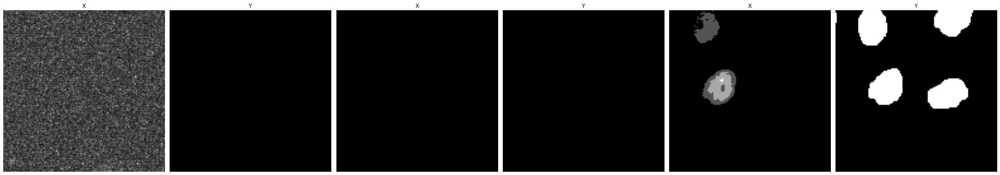

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Index used: 443
Index used: 490
Index used: 779


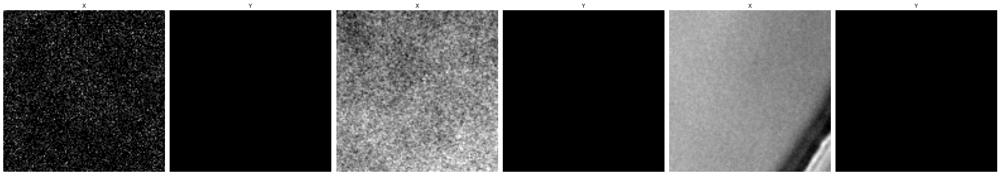

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Now, we can define a Sample Image and Sample Mask in case we with the visualize the training results. The author may disable this callback being used for training as it adds to the RAM usage in Google Colab

521


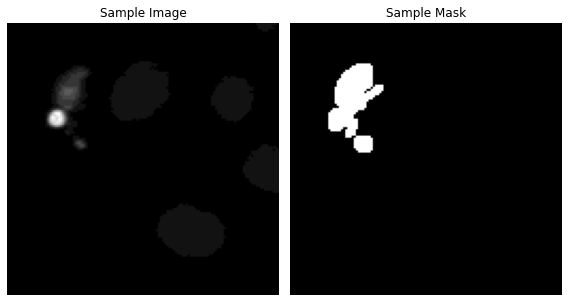

In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

from random import randint

# index = randint(0, len(training_x) - 1)
index = 521 # useful example, or 490
print(index)

sample_image = training_x[index]
sample_mask = training_y[index]

display( [sample_image, sample_mask], ["Sample Image", "Sample Mask"] , figsize=(8,8))

In [ ]:
patch_size = 128
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_128_1"

unet_128_model_1 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_128_model_1.summary()

Model: "UNET_Model_Dimension_128_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 128, 128, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 128, 128, 16  0           ['c1_a[0][0]']                   
                                )                                        

In [ ]:
unet_128_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

1/1 [==============================] - 0s 25ms/step


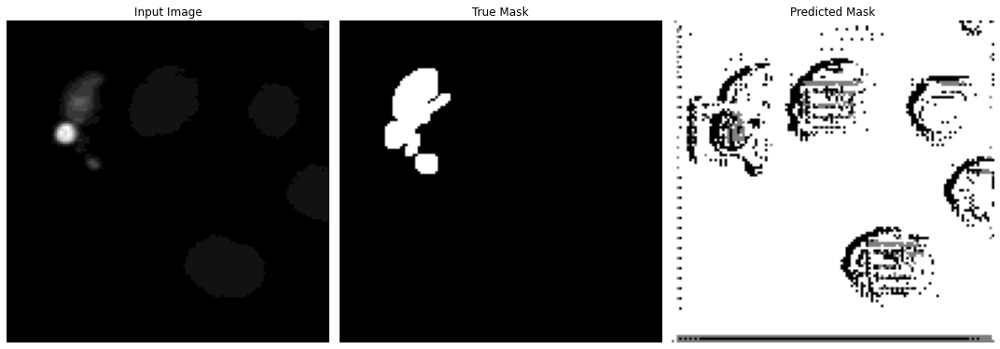


Sample Prediction after epoch 30

200/200 [==============================] - 4s 20ms/step - loss: 0.1780 - accuracy: 0.3391 - val_loss: 0.1525 - val_accuracy: 0.1302


In [ ]:
# Training Below

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_128_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

unet_128_model_1_history = unet_128_model_1.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

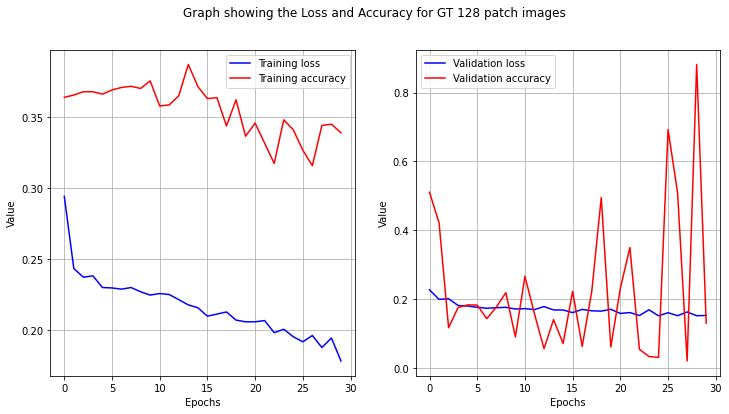

In [ ]:
showTrainingMetrics(unet_128_model_1_history, "Graph showing the Loss and Accuracy for GT 128 patch images")

In [ ]:
pred_y = unet_128_model_1.predict(test_x)

7/7 [==============================] - 1s 77ms/step


110


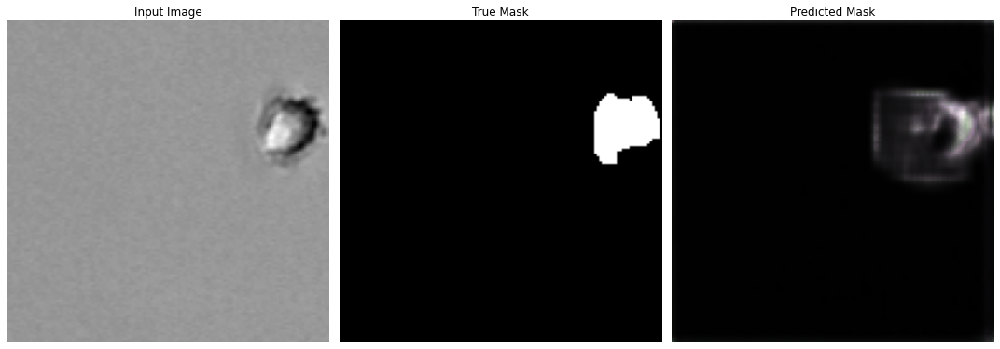

In [ ]:
index = 110
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

182


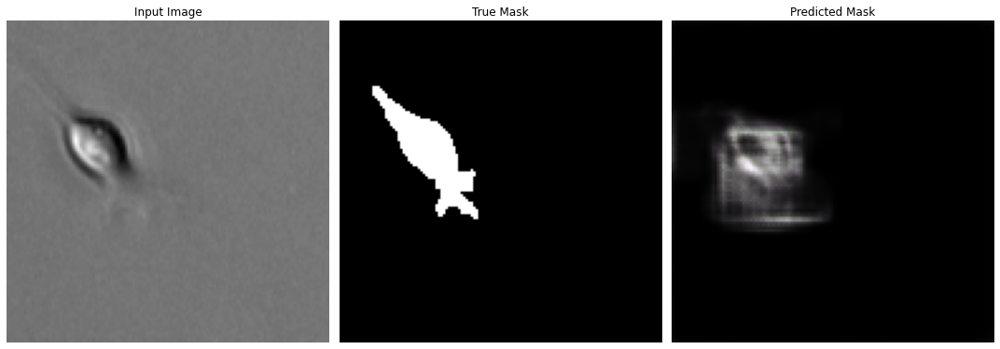

In [ ]:
index = 182
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Let's investigate what the Mean IoU score is:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.56878006
Min Value: 7.083368e-09
Average value: 0.04075935


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_128_model_score = calculateMeanIouScore(unet_128_model_1, test_x, test_y, pred_y_thresh)
print(unet_128_model_score)

0.00020223779528990448


Let's run that again, and increase the epochs:

1/1 [==============================] - 0s 24ms/step


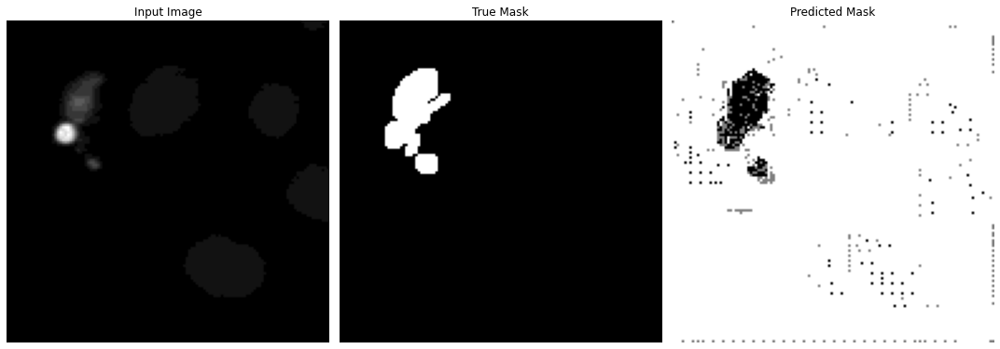


Sample Prediction after epoch 100

200/200 [==============================] - 4s 22ms/step - loss: 0.1141 - accuracy: 0.4223 - val_loss: 0.1432 - val_accuracy: 0.0082


In [ ]:
patch_size = 128
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_128_2"

unet_128_model_2 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_128_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_128_model_2_history = unet_128_model_2.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

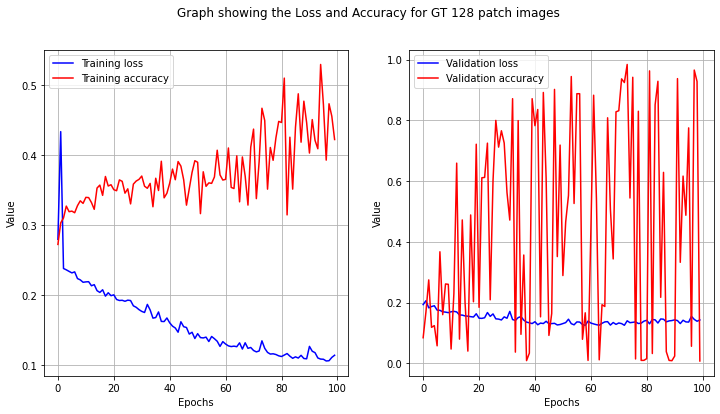

In [ ]:
showTrainingMetrics(unet_128_model_2_history, "Graph showing the Loss and Accuracy for GT 128 patch images")

Predictions:

In [ ]:
pred_y = unet_128_model_2.predict(test_x)

7/7 [==============================] - 0s 30ms/step


110


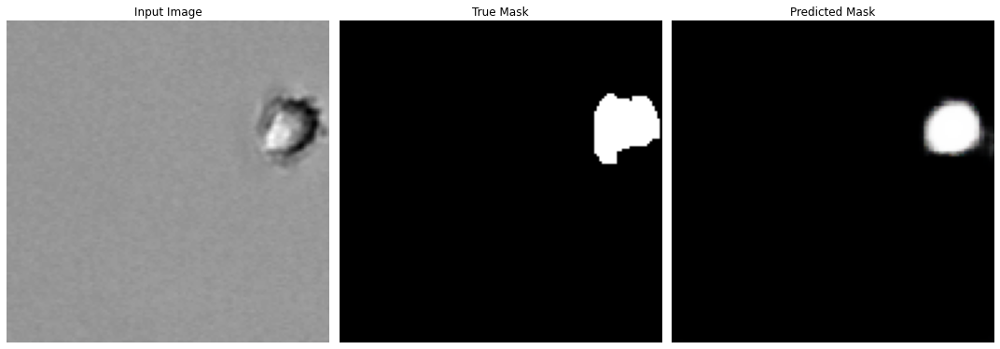

In [ ]:
index = 110
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

182


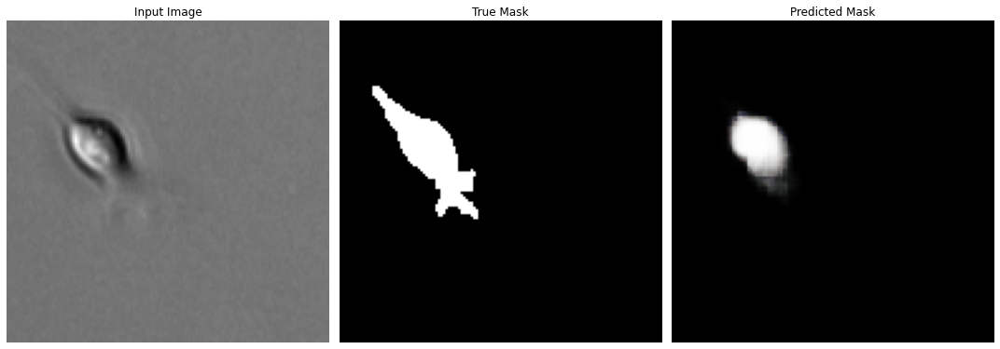

In [ ]:
index = 182
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 0.0
Average value: 0.04407165


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_128_model_score = calculateMeanIouScore(unet_128_model_2, test_x, test_y, pred_y_thresh)
print(unet_128_model_score)

0.23233587391378713


Let's modify the batch size:

1/1 [==============================] - 0s 18ms/step


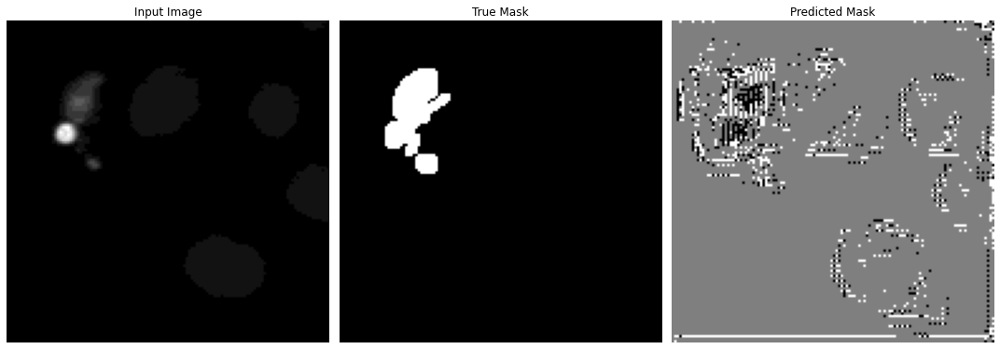


Sample Prediction after epoch 100

100/100 [==============================] - 3s 31ms/step - loss: 0.1054 - accuracy: 0.2141 - val_loss: 0.1371 - val_accuracy: 0.0125


In [ ]:
patch_size = 128
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_128_3"

unet_128_model_3 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_128_model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 8
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_128_model_3_history = unet_128_model_3.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

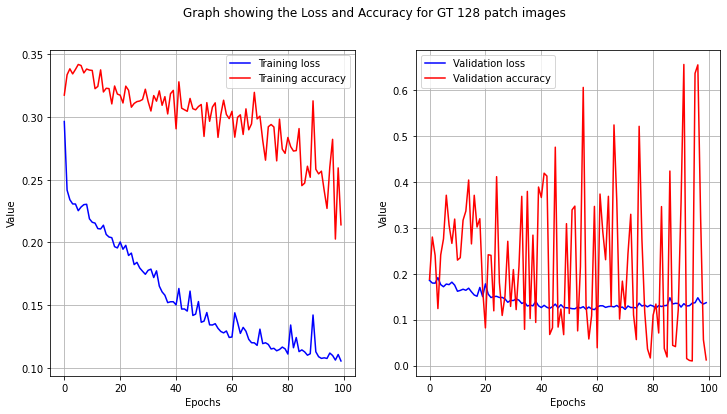

In [ ]:
showTrainingMetrics(unet_128_model_3_history, "Graph showing the Loss and Accuracy for GT 128 patch images")

Predictions:

In [ ]:
pred_y = unet_128_model_3.predict(test_x)

7/7 [==============================] - 0s 29ms/step


110


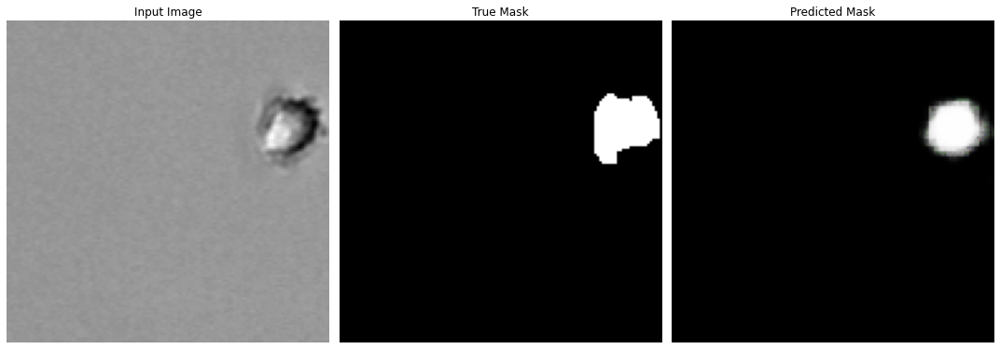

In [ ]:
index = 110
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

182


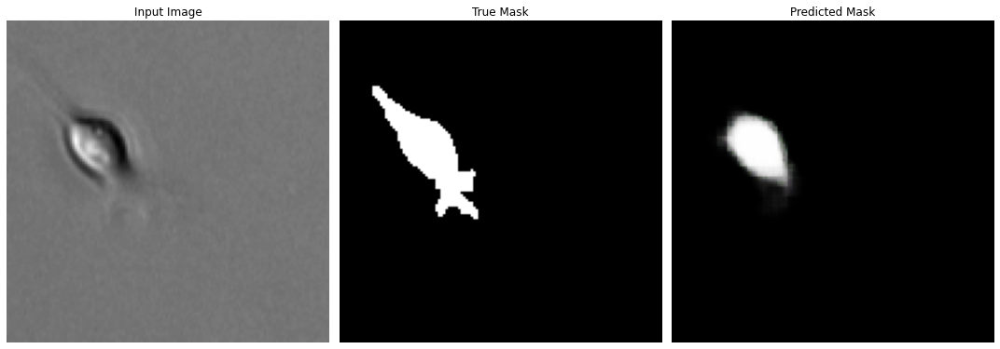

In [ ]:
index = 182
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 2.4562727e-27
Average value: 0.04574482


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_128_model_score = calculateMeanIouScore(unet_128_model_3, test_x, test_y, pred_y_thresh)
print(unet_128_model_score)

0.2303089280988843


After running those models several times, the second model has the best IoU Score of 0.22

## Save GT 128 Models

In [ ]:
training_data_code = getcwd() + google_drive_path + "/COMP700_Neural_Network_Code/"

tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_128"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_256"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_512"])

Save:

In [ ]:
path = training_data_code + "COMP700_UNet_Models/GT_128/"

unet_128_model_1.save(path + "gt_128_model_1")
unet_128_model_2.save(path + "gt_128_model_2")
unet_128_model_3.save(path + "gt_128_model_3")

Verify model saved:

In [ ]:
from keras.models import load_model

new_model = load_model(path + "gt_128_model_2")

# Check its architecture
new_model.summary()


Model: "UNET_Model_Dimension_128_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 128, 128, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 128, 128, 16  0           ['c1_a[0][0]']                   
                                )                                        

# Unet GT 256 Model

In [ ]:
temp_path = getImagePaths(training_data_directory + "COMP700_Patchify_Images_256_GT")
collection = []
labels = ["", "", "", ""]

for i in range(len(temp_path)):
    temp = temp_path[i][0]

    collection = temp_path[i]
    collection.sort()

    if ("Training/X" in temp):
      training_x = readImagesViaMatplotlib(collection)
      labels[0] = collection
    elif ("Training/Y" in temp):
      training_y = readImagesViaMatplotlib(collection)
      labels[1] = collection
    elif ("Test/X" in temp):
      test_x = readImagesViaMatplotlib(collection)
      labels[2] = collection
    elif ("Test/Y" in temp):
      test_y = readImagesViaMatplotlib(collection)
      labels[3] = collection
    else:
      print("Unknown path specified")

Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete


In [ ]:
print(len(training_x), ":::", len(training_y))
print(len(test_x), ":::", len(test_y))

800 ::: 800
200 ::: 200


Verify images match:

In [ ]:
for i in range(5):
    print( extractRhsString(labels[0][i], "/"), ":::", extractRhsString(labels[1][i], "/") )

training_image_0001.png ::: training_mask_0001.png
training_image_0002.png ::: training_mask_0002.png
training_image_0003.png ::: training_mask_0003.png
training_image_0004.png ::: training_mask_0004.png
training_image_0005.png ::: training_mask_0005.png


In [ ]:
count = 0

for i in range(len(training_x)):
    if ( extractRhsString(labels[0][i], "_") != extractRhsString(labels[1][i], "_") ):
        count += 1

print(count, "image(s) do not match")

0 image(s) do not match


Let us load some images to see the training data we have available to us

Index used: 438
Index used: 393
Index used: 251


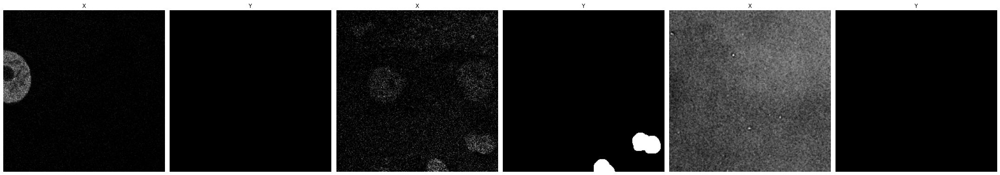

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Index used: 173
Index used: 509
Index used: 246


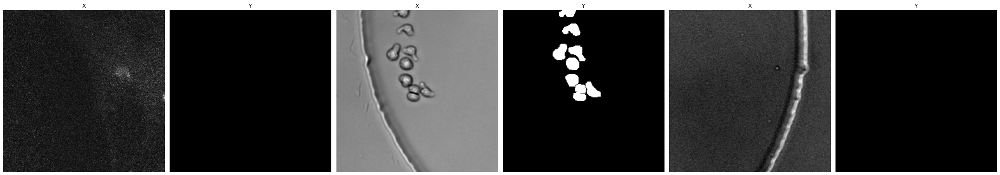

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Now, we can define a Sample Image and Sample Mask in case we with the visualize the training results. The author may disable this callback being used for training as it adds to the RAM usage in Google Colab

509


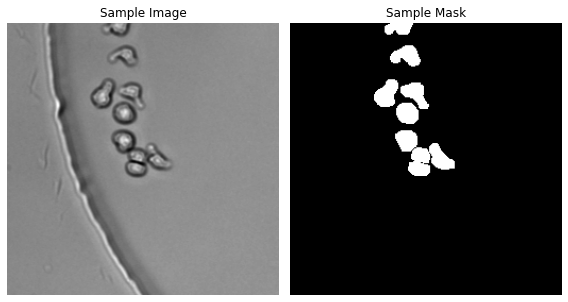

In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

from random import randint

# index = randint(0, len(training_x) - 1)
index = 509 # useful example, or 393
print(index)

sample_image = training_x[index]
sample_mask = training_y[index]

display( [sample_image, sample_mask], ["Sample Image", "Sample Mask"] , figsize=(8,8))

In [ ]:
patch_size = 256
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_256_1"

unet_256_model_1 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_256_model_1.summary()

Model: "UNET_Model_Dimension_256_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 256, 256, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 256, 256, 16  0           ['c1_a[0][0]']                   
                                )                                        

In [ ]:
unet_256_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

1/1 [==============================] - 0s 19ms/step


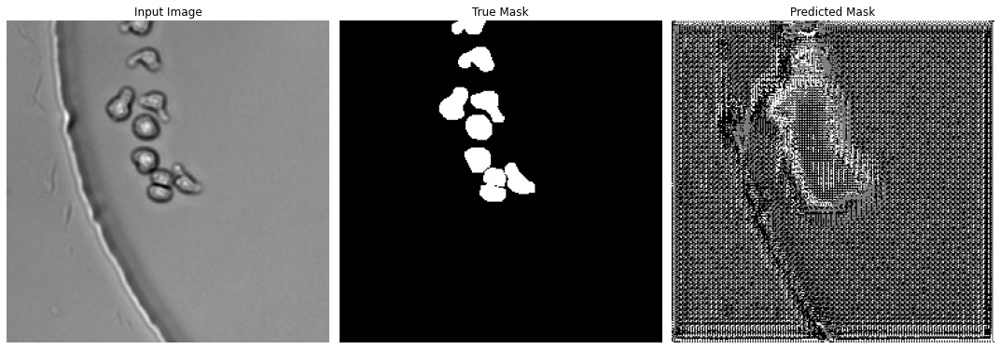


Sample Prediction after epoch 30

200/200 [==============================] - 10s 51ms/step - loss: 0.1470 - accuracy: 0.2067 - val_loss: 0.1421 - val_accuracy: 0.6589


In [ ]:
# Training Below

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_256_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

unet_256_model_1_history = unet_256_model_1.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

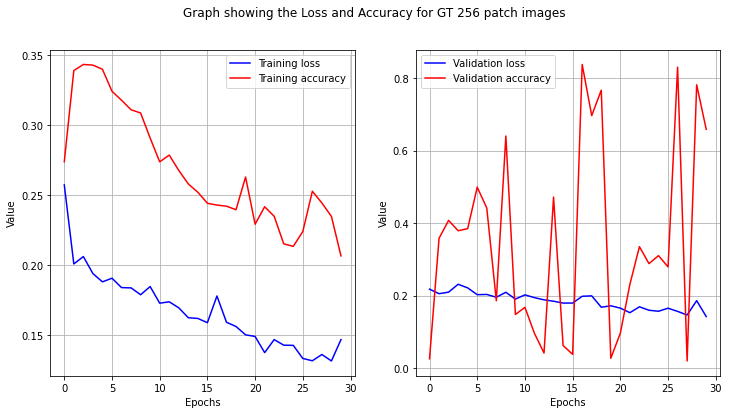

In [ ]:
showTrainingMetrics(unet_256_model_1_history, "Graph showing the Loss and Accuracy for GT 256 patch images")

In [ ]:
pred_y = unet_256_model_1.predict(test_x)

7/7 [==============================] - 3s 191ms/step


91


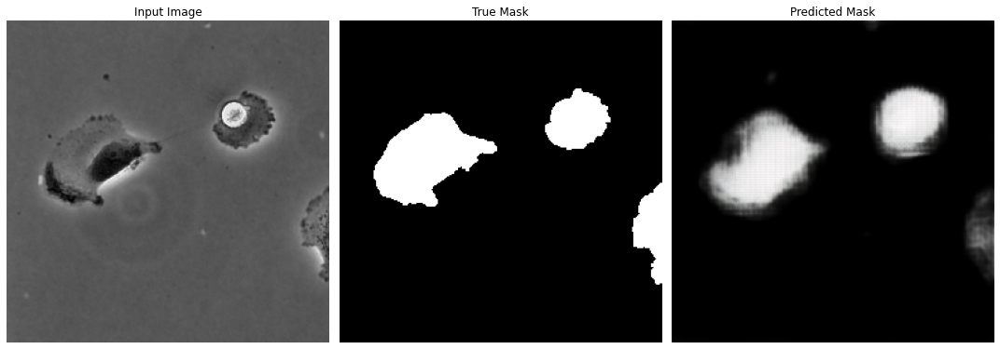

In [ ]:
index = 91
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

165


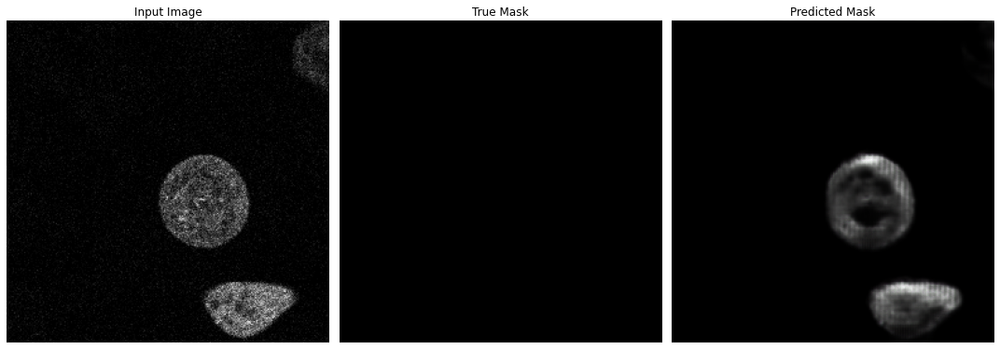

In [ ]:
index = 165
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Let's investigate what the Mean IoU score is:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.7945004
Min Value: 1.4182668e-08
Average value: 0.0398949


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_256_model_score = calculateMeanIouScore(unet_256_model_1, test_x, test_y, pred_y_thresh)
print(unet_256_model_score)

0.09737423755264414


Let's run that again, and increase the epochs:

1/1 [==============================] - 0s 18ms/step


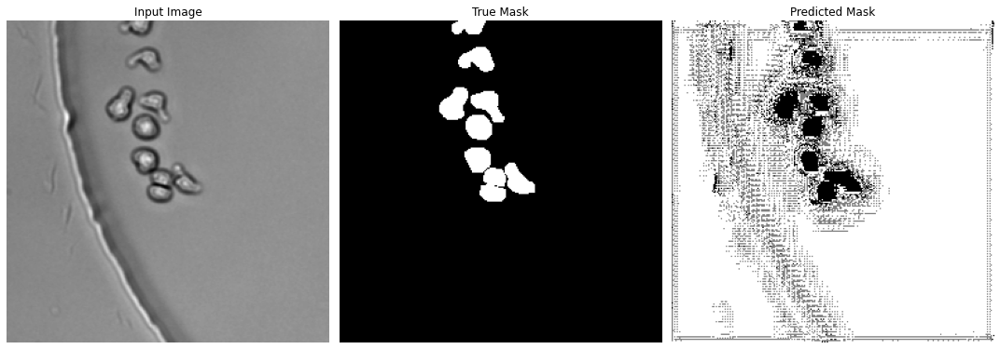


Sample Prediction after epoch 100

200/200 [==============================] - 10s 50ms/step - loss: 0.0981 - accuracy: 0.1780 - val_loss: 0.1146 - val_accuracy: 0.0396


In [ ]:
patch_size = 256
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_256_2"

unet_256_model_2 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_256_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_256_model_2_history = unet_256_model_2.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

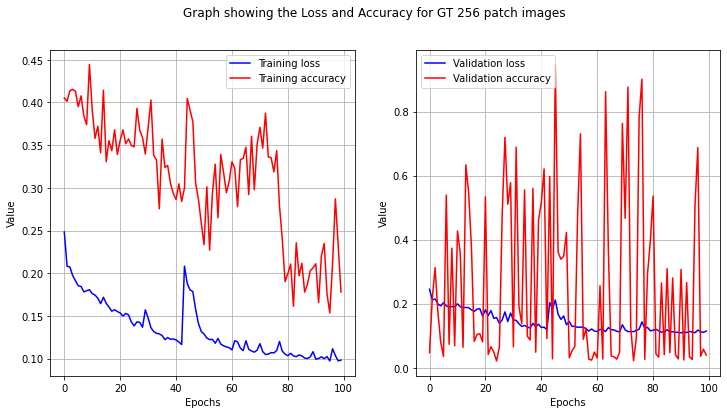

In [ ]:
showTrainingMetrics(unet_256_model_2_history, "Graph showing the Loss and Accuracy for GT 256 patch images")

Predictions:

In [ ]:
pred_y = unet_256_model_2.predict(test_x)

7/7 [==============================] - 1s 83ms/step


91


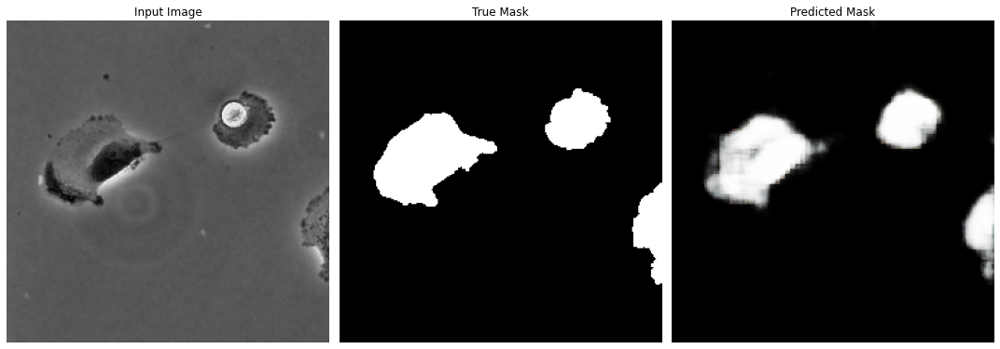

In [ ]:
index = 91
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

165


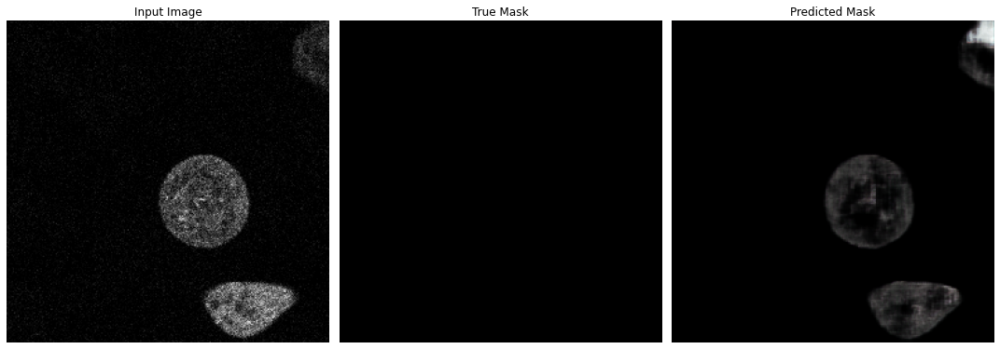

In [ ]:
index = 165
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 5.129627e-37
Average value: 0.05090308


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_256_model_score = calculateMeanIouScore(unet_256_model_2, test_x, test_y, pred_y_thresh)
print(unet_256_model_score)

0.4493338069754643


Let's modify the batch size:

1/1 [==============================] - 0s 26ms/step


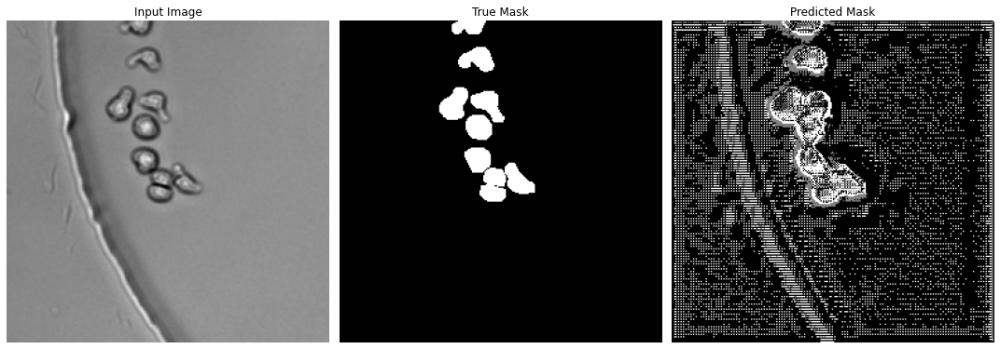


Sample Prediction after epoch 100

100/100 [==============================] - 11s 105ms/step - loss: 0.0782 - accuracy: 0.5804 - val_loss: 0.1233 - val_accuracy: 0.6195


In [ ]:
patch_size = 256
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_256_3"

unet_256_model_3 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_256_model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 8
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_256_model_3_history = unet_256_model_3.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

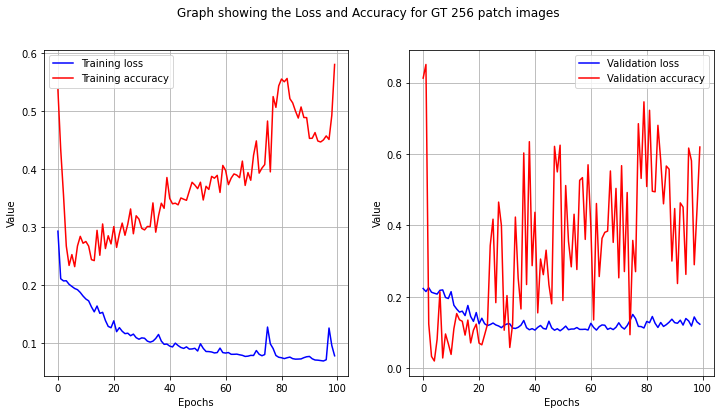

In [ ]:
showTrainingMetrics(unet_256_model_3_history, "Graph showing the Loss and Accuracy for GT 256 patch images")

Predictions:

In [ ]:
pred_y = unet_256_model_3.predict(test_x)

7/7 [==============================] - 1s 87ms/step


91


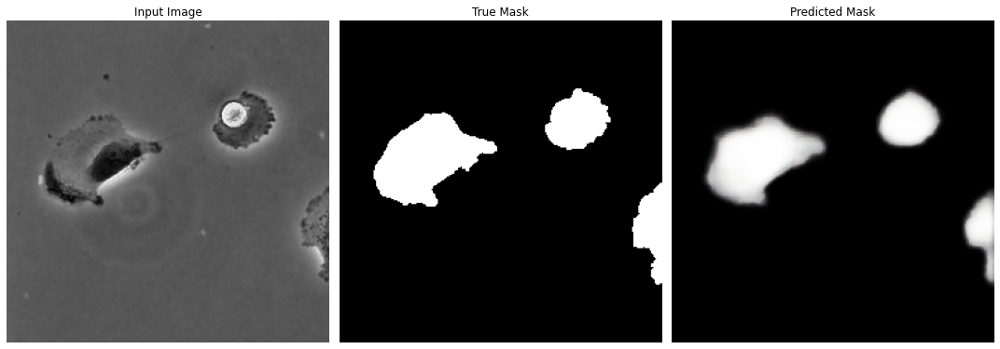

In [ ]:
index = 91
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

165


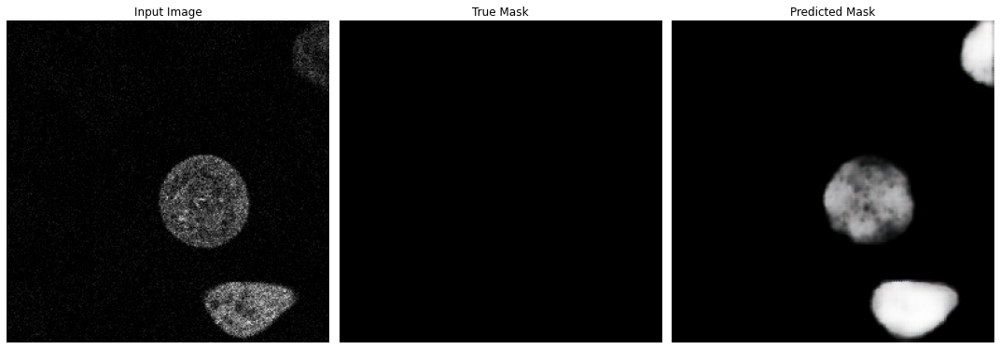

In [ ]:
index = 165
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 1.4913152e-37
Average value: 0.050256483


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_256_model_score = calculateMeanIouScore(unet_256_model_3, test_x, test_y, pred_y_thresh)
print(unet_256_model_score)

0.42511034745091075


After running those models several times, the second model has the best IoU Score of 0.44

## Save GT 256 Models

In [ ]:
training_data_code = getcwd() + google_drive_path + "/COMP700_Neural_Network_Code/"

tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_128"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_256"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_512"])

Save:

In [ ]:
path = training_data_code + "COMP700_UNet_Models/GT_256/"

unet_256_model_1.save(path + "gt_256_model_1")
unet_256_model_2.save(path + "gt_256_model_2")
unet_256_model_3.save(path + "gt_256_model_3")

Verify model saved:

In [ ]:
from keras.models import load_model

new_model = load_model(path + "gt_256_model_2")

# Check its architecture
new_model.summary()


Model: "UNET_Model_Dimension_256_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 256, 256, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 256, 256, 16  0           ['c1_a[0][0]']                   
                                )                                        

# Unet GT 512 Model 

In [ ]:
temp_path = getImagePaths(training_data_directory + "COMP700_Patchify_Images_512_GT")
collection = []
labels = ["", "", "", ""]

for i in range(len(temp_path)):
    temp = temp_path[i][0]

    collection = temp_path[i]
    collection.sort()

    if ("Training/X" in temp):
      training_x = readImagesViaMatplotlib(collection)
      labels[0] = collection
    elif ("Training/Y" in temp):
      training_y = readImagesViaMatplotlib(collection)
      labels[1] = collection
    elif ("Test/X" in temp):
      test_x = readImagesViaMatplotlib(collection)
      labels[2] = collection
    elif ("Test/Y" in temp):
      test_y = readImagesViaMatplotlib(collection)
      labels[3] = collection
    else:
      print("Unknown path specified")

Processed 0 images out of 487
Processed 100 images out of 487
Processed 200 images out of 487
Processed 300 images out of 487
Processed 400 images out of 487
Complete
Processed 0 images out of 487
Processed 100 images out of 487
Processed 200 images out of 487
Processed 300 images out of 487
Processed 400 images out of 487
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete


In [ ]:
print(len(training_x), ":::", len(training_y))
print(len(test_x), ":::", len(test_y))

487 ::: 487
200 ::: 200


Verify images match:

In [ ]:
for i in range(5):
    print( extractRhsString(labels[0][i], "/"), ":::", extractRhsString(labels[1][i], "/") )

training_image_0001.png ::: training_mask_0001.png
training_image_0002.png ::: training_mask_0002.png
training_image_0003.png ::: training_mask_0003.png
training_image_0004.png ::: training_mask_0004.png
training_image_0005.png ::: training_mask_0005.png


In [ ]:
count = 0

for i in range(len(training_x)):
    if ( extractRhsString(labels[0][i], "_") != extractRhsString(labels[1][i], "_") ):
        count += 1

print(count, "image(s) do not match")

0 image(s) do not match


Let us load some images to see the training data we have available to us

Index used: 456
Index used: 434
Index used: 421


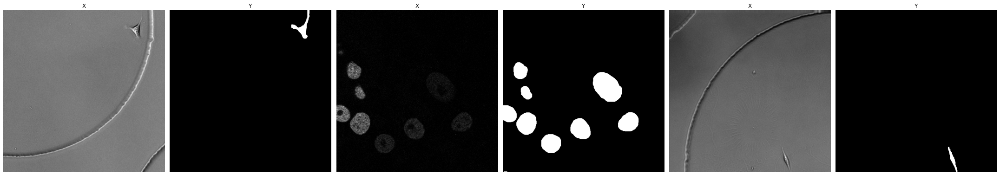

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Index used: 61
Index used: 469
Index used: 108


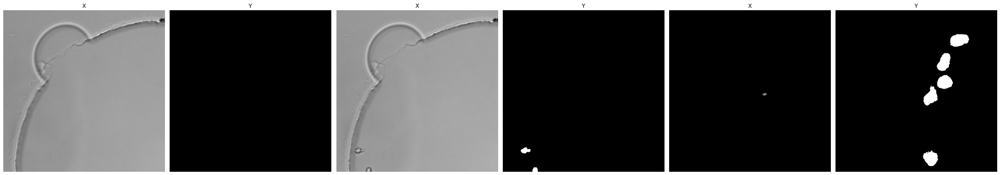

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Now, we can define a Sample Image and Sample Mask in case we with the visualize the training results. The author may disable this callback being used for training as it adds to the RAM usage in Google Colab

46


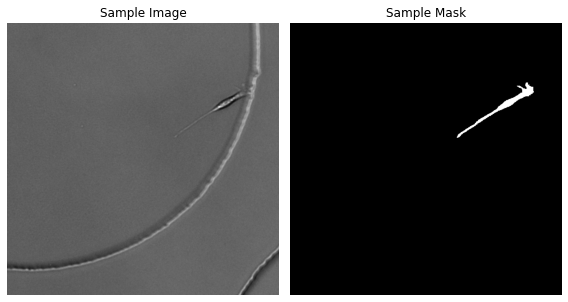

In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

from random import randint

# index = randint(0, len(training_x) - 1)
index = 46 # useful example, or 380 or 434
print(index)

sample_image = training_x[index]
sample_mask = training_y[index]

display( [sample_image, sample_mask], ["Sample Image", "Sample Mask"] , figsize=(8,8))

In [ ]:
patch_size = 512
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_512_1"

unet_512_model_1 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_512_model_1.summary()

Model: "UNET_Model_Dimension_512_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 512, 512, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 512, 512, 16  0           ['c1_a[0][0]']                   
                                )                                        

In [ ]:
unet_512_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

The session seems to crash when using the full dataset, so let's use half:

1/1 [==============================] - 0s 43ms/step


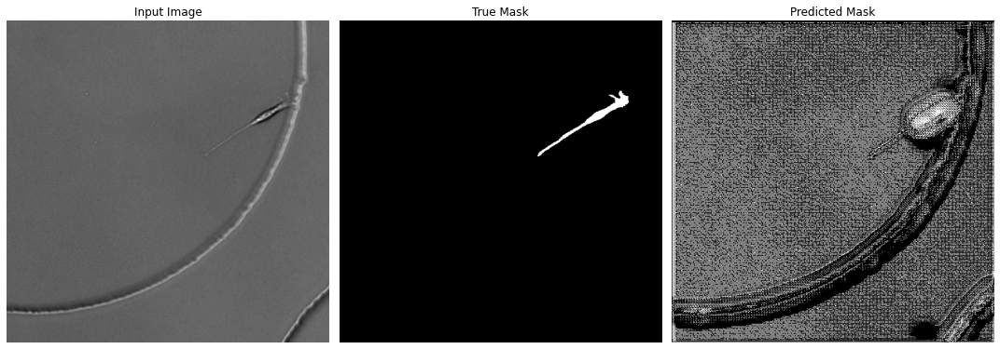


Sample Prediction after epoch 16

121/121 [==============================] - 7s 61ms/step - loss: 0.1537 - accuracy: 0.4376


In [ ]:
# Training Below

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_512_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

unet_512_model_1_history = unet_512_model_1.fit(
                                            training_x[:125],
                                            training_y[:125], 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x[:50], test_y[:50])
                                            )

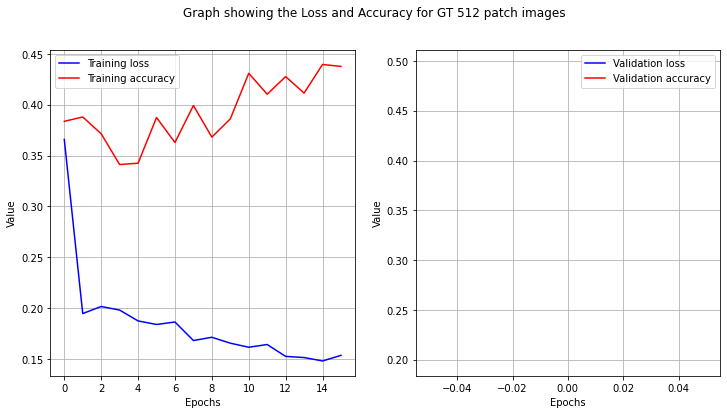

In [ ]:
showTrainingMetrics(unet_512_model_1_history, "Graph showing the Loss and Accuracy for GT 512 patch images")

In [ ]:
pred_y = unet_512_model_1.predict(test_x)

7/7 [==============================] - 9s 576ms/step


110


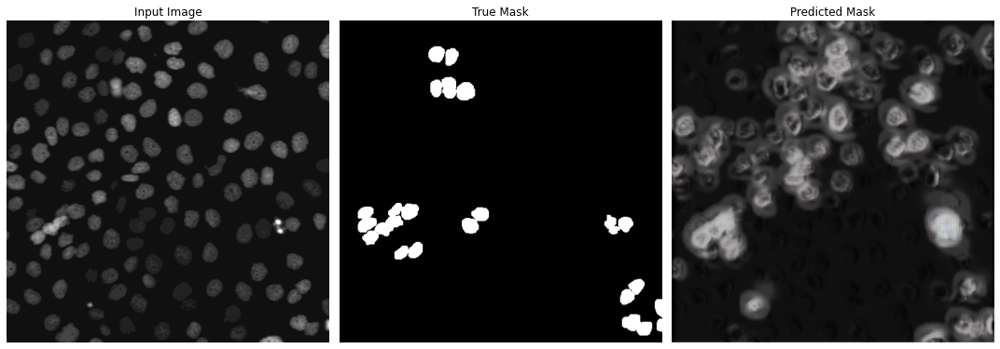

In [ ]:
index = 110
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

182


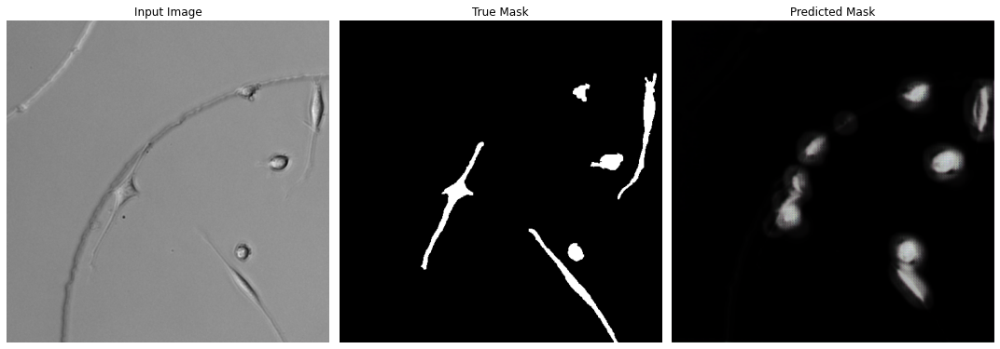

In [ ]:
index = 182
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Let's investigate what the Mean IoU score is:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.9990559
Min Value: 2.768472e-05
Average value: 0.053833675


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_512_model_score = calculateMeanIouScore(unet_512_model_1, test_x, test_y, pred_y_thresh)
print(unet_512_model_score)

0.06785590771316094


Let's run that again, and increase the epochs:

1/1 [==============================] - 0s 22ms/step


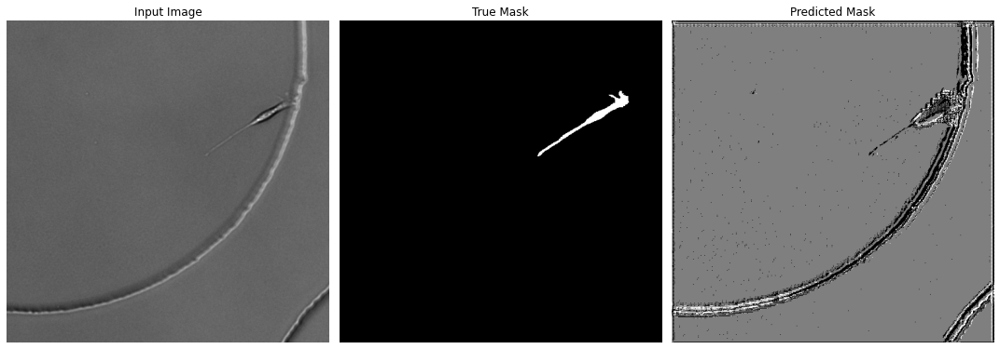


Sample Prediction after epoch 53

121/121 [==============================] - 1s 8ms/step - loss: 0.1873 - accuracy: 0.3239


In [ ]:
patch_size = 512
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_512_2"

unet_512_model_2 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_512_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_512_model_2_history = unet_512_model_2.fit(
                                            training_x[:125],
                                            training_y[:125], 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x[:50], test_y[:50])
                                            )

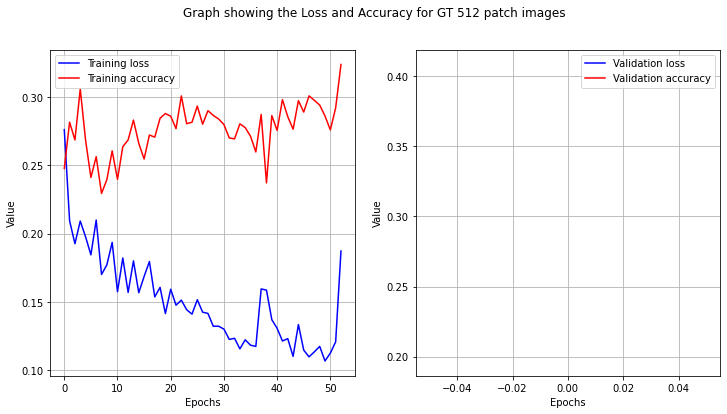

In [ ]:
showTrainingMetrics(unet_512_model_2_history, "Graph showing the Loss and Accuracy for GT 512 patch images")

Predictions:

In [ ]:
pred_y = unet_512_model_2.predict(test_x)

7/7 [==============================] - 2s 367ms/step


110


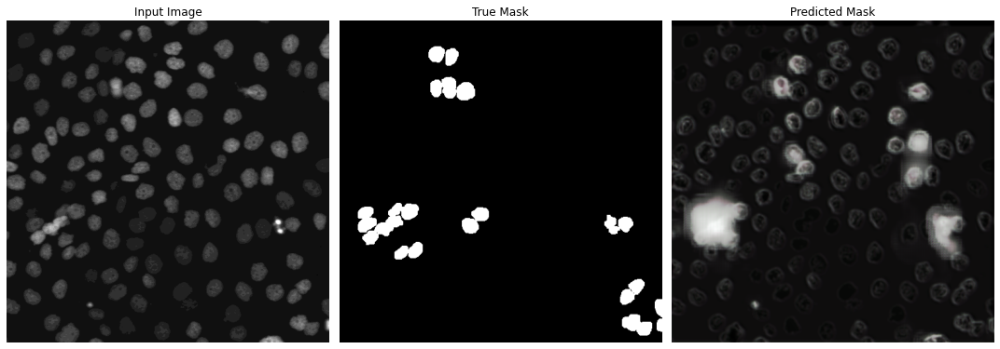

In [ ]:
index = 110
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

182


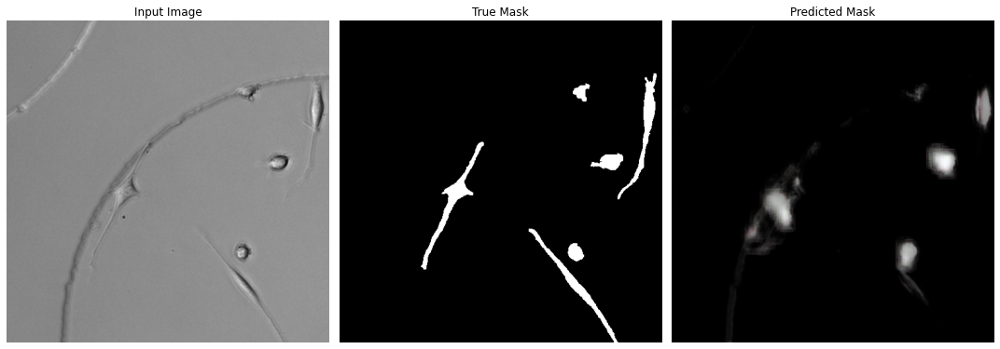

In [ ]:
index = 182
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.9996043
Min Value: 1.613336e-06
Average value: 0.05040564


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_512_model_score = calculateMeanIouScore(unet_512_model_2, test_x, test_y, pred_y_thresh)
print(unet_512_model_score)

0.26227370061466765


Let's modify the batch size:

1/1 [==============================] - 0s 40ms/step


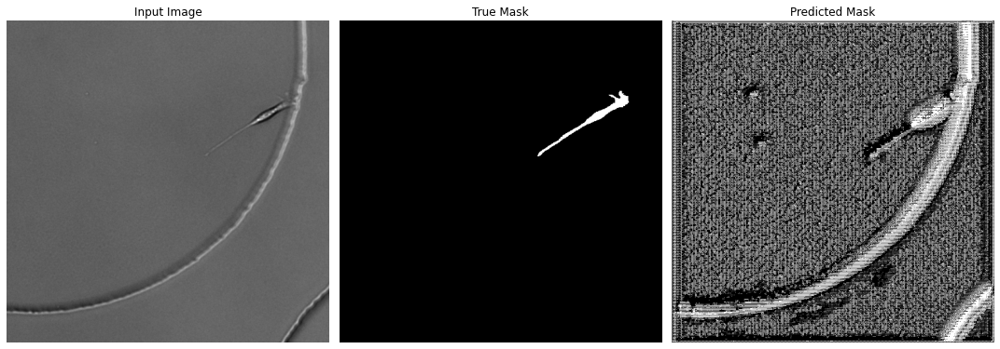


Sample Prediction after epoch 71

60/60 [==============================] - 1s 9ms/step - loss: 0.1015 - accuracy: 0.3416


In [ ]:
patch_size = 512
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_512_3"

unet_512_model_3 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_512_model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 8
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_512_model_3_history = unet_512_model_3.fit(
                                            training_x[:125],
                                            training_y[:125], 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x[:50], test_y[:50])
                                            )

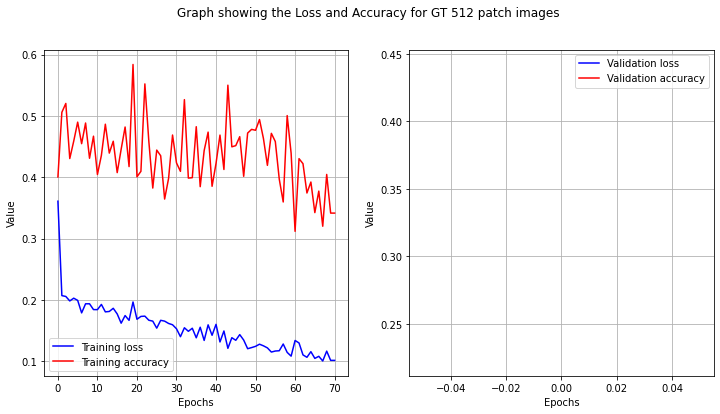

In [ ]:
showTrainingMetrics(unet_512_model_3_history, "Graph showing the Loss and Accuracy for GT 512 patch images")

Predictions:

In [ ]:
pred_y = unet_512_model_3.predict(test_x)

7/7 [==============================] - 2s 363ms/step


110


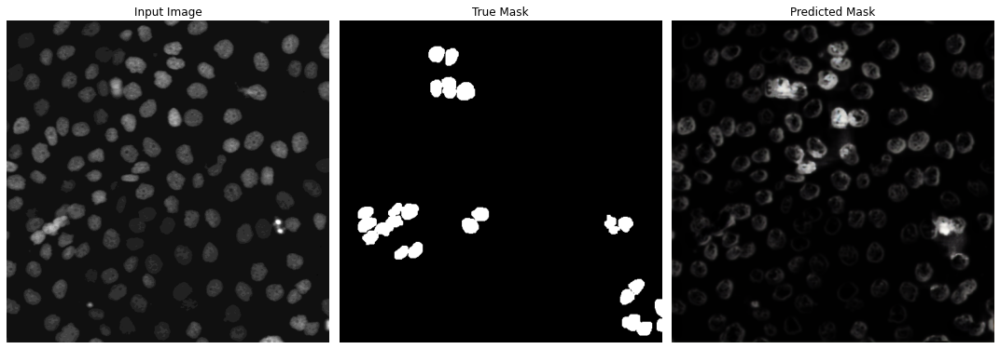

In [ ]:
index = 110
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

182


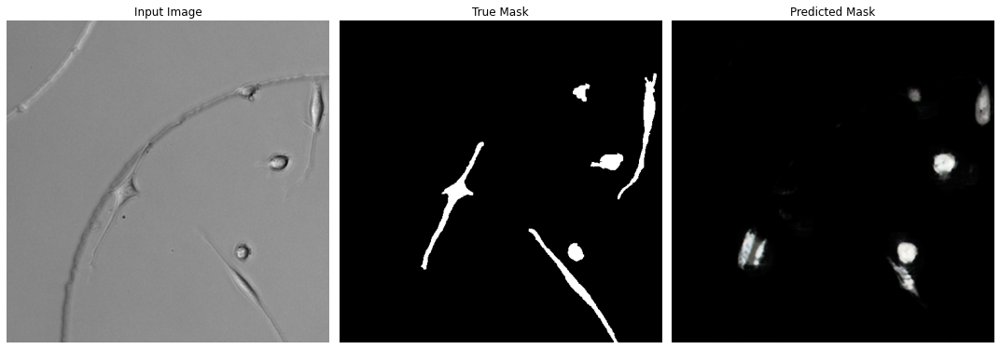

In [ ]:
index = 182
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.99884605
Min Value: 1.230705e-17
Average value: 0.03943565


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_512_model_score = calculateMeanIouScore(unet_512_model_3, test_x, test_y, pred_y_thresh)
print(unet_512_model_score)

0.2992224924408336


After running those models several times, the second model has the best IoU Score of 0.22

## Save GT 512 Models

Save individually because of RAM usage

In [ ]:
training_data_code = getcwd() + google_drive_path + "/COMP700_Neural_Network_Code/"

tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_128"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_256"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "GT_512"])

Save:

In [ ]:
path = training_data_code + "COMP700_UNet_Models/GT_512/"

In [ ]:
unet_512_model_1.save(path + "gt_512_model_1")

In [ ]:
unet_512_model_2.save(path + "gt_512_model_2")

In [ ]:
unet_512_model_3.save(path + "gt_512_model_3")

Verify model saved:

In [ ]:
from keras.models import load_model

new_model = load_model(path + "gt_512_model_2")

# Check its architecture
new_model.summary()


Model: "UNET_Model_Dimension_512_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 512, 512, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 512, 512, 16  0           ['c1_a[0][0]']                   
                                )                                        

# Unet ST 128 Model

Google seems to store some images in a random order (perhaps a HashMap?) when generated via Google Colab. This means the specific location of desirable information is not known and we need to handle some randomness:

In [ ]:
temp_path = getImagePaths(training_data_directory + "COMP700_Patchify_Images_128_ST")
collection = []
labels = ["", "", "", ""]

for i in range(len(temp_path)):
    temp = temp_path[i][0]

    collection = temp_path[i]
    collection.sort()

    if ("Training/X" in temp):
      training_x = readImagesViaMatplotlib(collection)
      labels[0] = collection
    elif ("Training/Y" in temp):
      training_y = readImagesViaMatplotlib(collection)
      labels[1] = collection
    elif ("Test/X" in temp):
      test_x = readImagesViaMatplotlib(collection)
      labels[2] = collection
    elif ("Test/Y" in temp):
      test_y = readImagesViaMatplotlib(collection)
      labels[3] = collection
    else:
      print("Unknown path specified")

Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete


In [ ]:
print(len(training_x), ":::", len(training_y))
print(len(test_x), ":::", len(test_y))

800 ::: 800
200 ::: 200


Verify images match:

In [ ]:
for i in range(5):
    print( extractRhsString(labels[0][i], "/"), ":::", extractRhsString(labels[1][i], "/") )

training_image_0001.png ::: training_mask_0001.png
training_image_0002.png ::: training_mask_0002.png
training_image_0003.png ::: training_mask_0003.png
training_image_0004.png ::: training_mask_0004.png
training_image_0005.png ::: training_mask_0005.png


In [ ]:
count = 0

for i in range(len(training_x)):
    if ( extractRhsString(labels[0][i], "_") != extractRhsString(labels[1][i], "_") ):
        count += 1

print(count, "image(s) do not match")

0 image(s) do not match


Let us load some images to see the training data we have available to us

Index used: 106
Index used: 736
Index used: 532


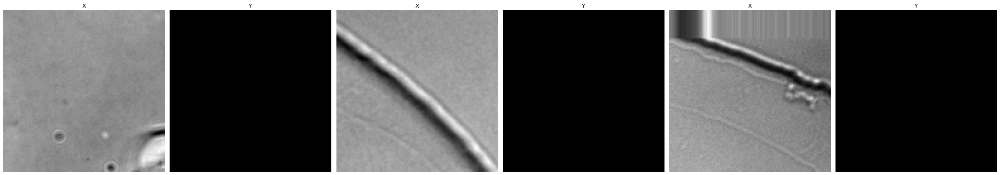

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Index used: 49
Index used: 264
Index used: 497


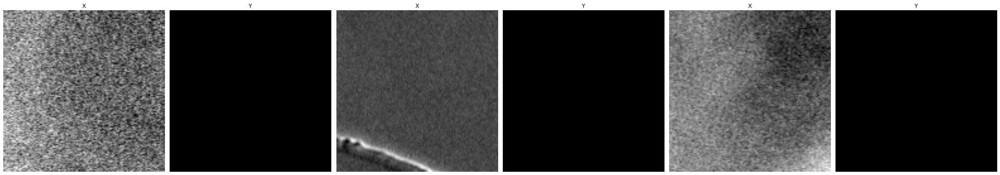

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Now, we can define a Sample Image and Sample Mask in case we with the visualize the training results. The author may disable this callback being used for training as it adds to the RAM usage in Google Colab

130


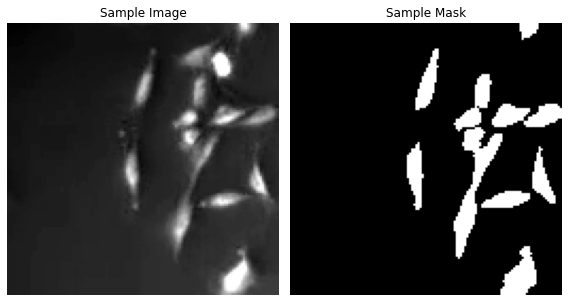

In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

from random import randint

# index = randint(0, len(training_x) - 1)
index = 130 # useful example, or 123
print(index)

sample_image = training_x[index]
sample_mask = training_y[index]

display( [sample_image, sample_mask], ["Sample Image", "Sample Mask"] , figsize=(8,8))

In [ ]:
patch_size = 128
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_128_1"

unet_128_model_1 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_128_model_1.summary()

Model: "UNET_Model_Dimension_128_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 128, 128, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 128, 128, 16  0           ['c1_a[0][0]']                   
                                )                                        

In [ ]:
unet_128_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

1/1 [==============================] - 0s 22ms/step


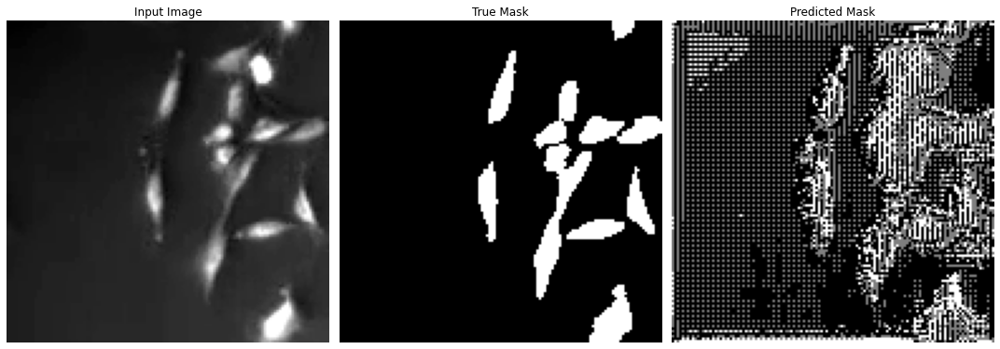


Sample Prediction after epoch 30

200/200 [==============================] - 4s 20ms/step - loss: 0.0467 - accuracy: 0.3166 - val_loss: 0.0449 - val_accuracy: 0.7016


In [ ]:
# Training Below

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_128_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

unet_128_model_1_history = unet_128_model_1.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

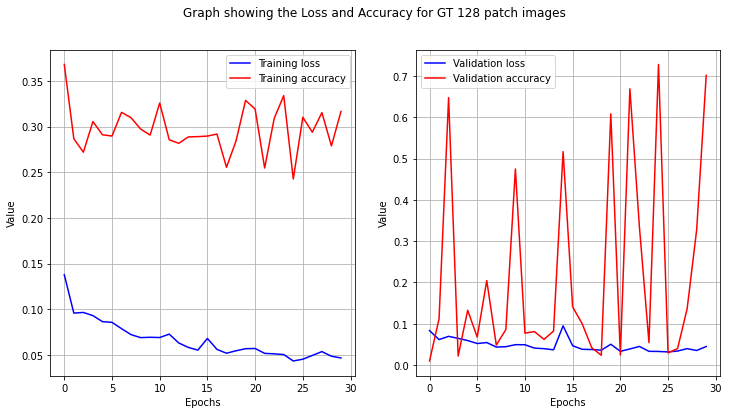

In [ ]:
showTrainingMetrics(unet_128_model_1_history, "Graph showing the Loss and Accuracy for GT 128 patch images")

In [ ]:
pred_y = unet_128_model_1.predict(test_x)

7/7 [==============================] - 0s 33ms/step


84


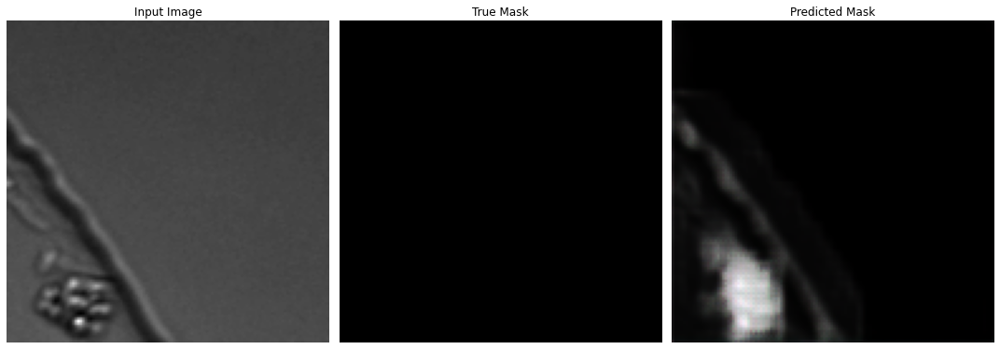

In [ ]:
index = 84
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

130


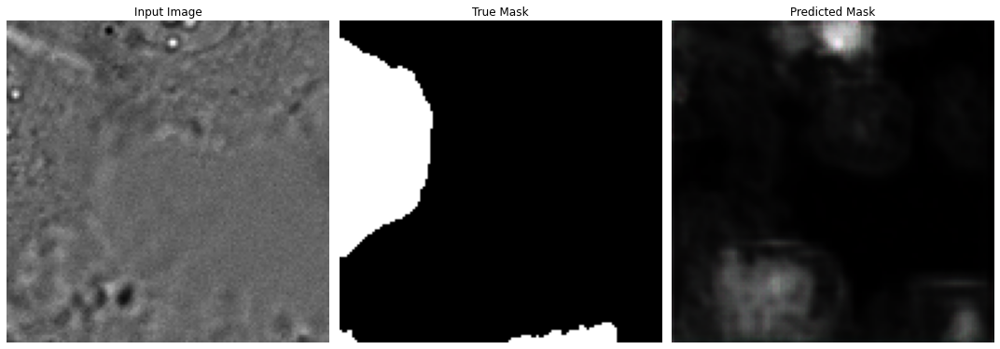

In [ ]:
index = 130
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Let's investigate what the Mean IoU score is:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 1.9143426e-05
Average value: 0.031859208


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_128_model_score = calculateMeanIouScore(unet_128_model_1, test_x, test_y, pred_y_thresh)
print(unet_128_model_score)

0.4285393618726952


Let's run that again, and increase the epochs:

1/1 [==============================] - 0s 16ms/step


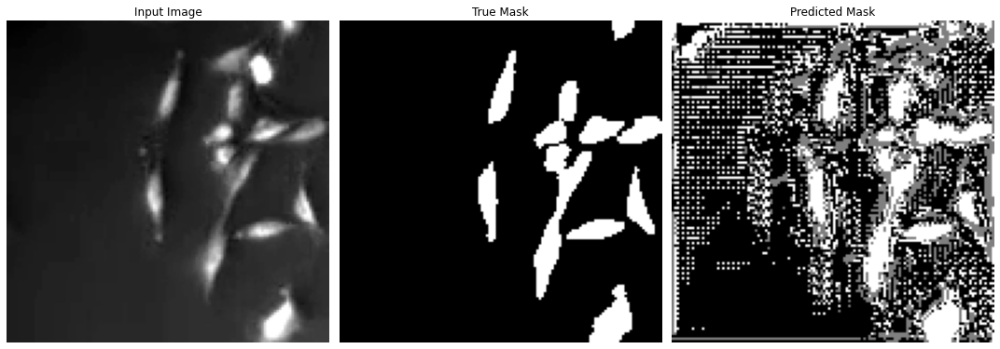


Sample Prediction after epoch 100

200/200 [==============================] - 4s 18ms/step - loss: 0.0109 - accuracy: 0.3891 - val_loss: 0.0338 - val_accuracy: 0.4921


In [ ]:
patch_size = 128
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_128_2"

unet_128_model_2 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_128_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_128_model_2_history = unet_128_model_2.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

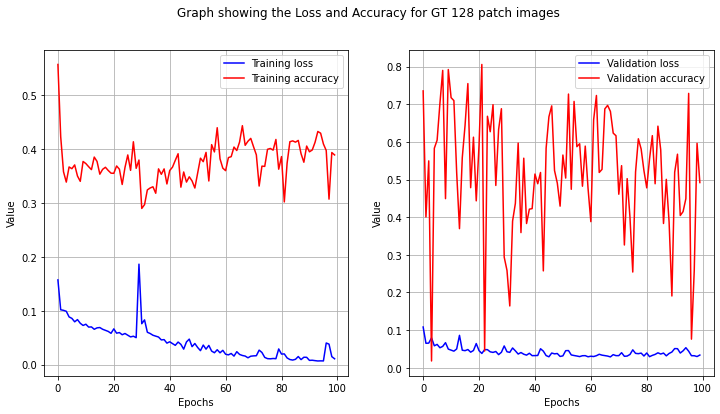

In [ ]:
showTrainingMetrics(unet_128_model_2_history, "Graph showing the Loss and Accuracy for GT 128 patch images")

Predictions:

In [ ]:
pred_y = unet_128_model_2.predict(test_x)

7/7 [==============================] - 0s 30ms/step


84


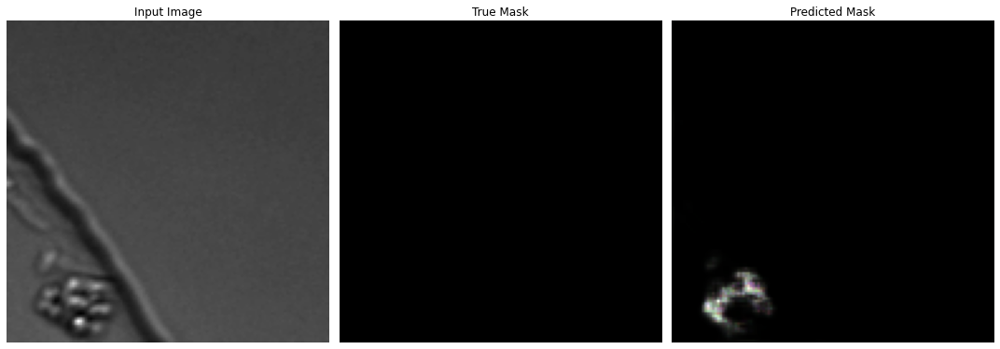

In [ ]:
index = 84
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

130


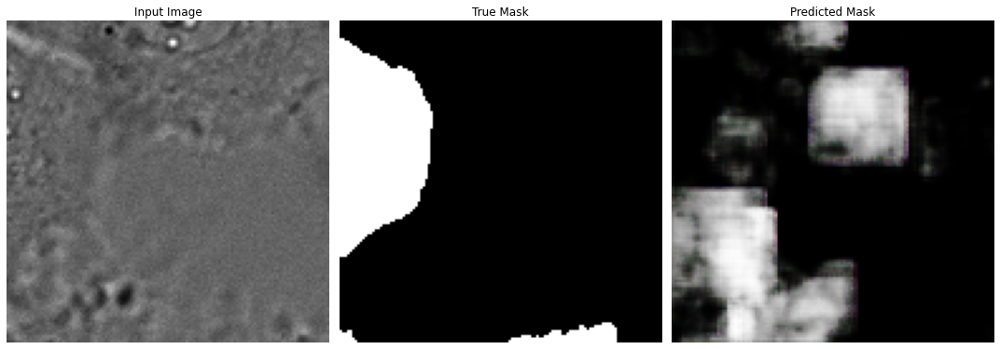

In [ ]:
index = 130
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 9.861214e-21
Average value: 0.00995534


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_128_model_score = calculateMeanIouScore(unet_128_model_2, test_x, test_y, pred_y_thresh)
print(unet_128_model_score)

0.5390647236295326


Let's modify the batch size:

1/1 [==============================] - 0s 23ms/step


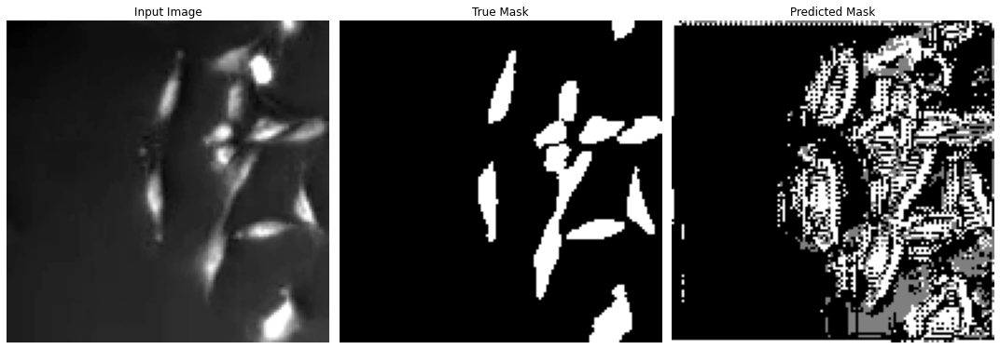


Sample Prediction after epoch 100

100/100 [==============================] - 3s 31ms/step - loss: 0.0074 - accuracy: 0.2432 - val_loss: 0.0383 - val_accuracy: 0.3293


In [ ]:
patch_size = 128
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_128_3"

unet_128_model_3 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_128_model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 8
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_128_model_3_history = unet_128_model_3.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

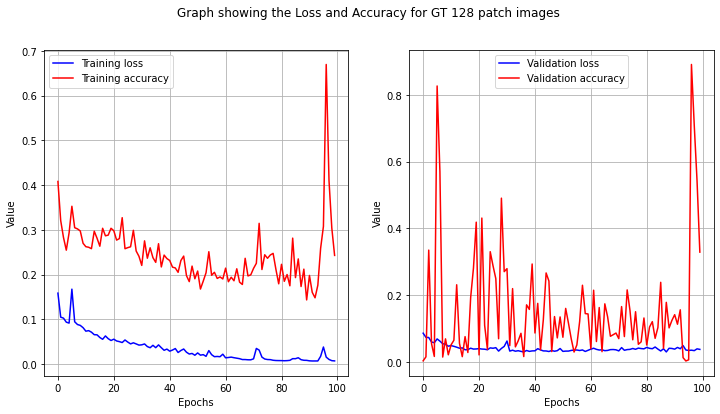

In [ ]:
showTrainingMetrics(unet_128_model_3_history, "Graph showing the Loss and Accuracy for GT 128 patch images")

Predictions:

In [ ]:
pred_y = unet_128_model_3.predict(test_x)

7/7 [==============================] - 0s 31ms/step


84


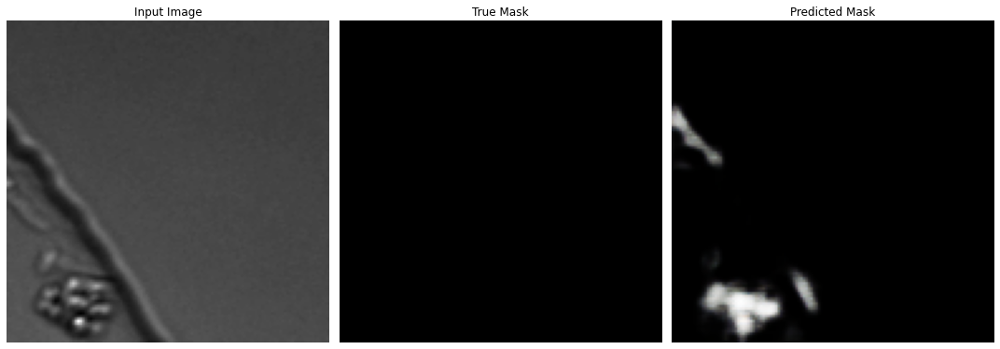

In [ ]:
index = 84
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

130


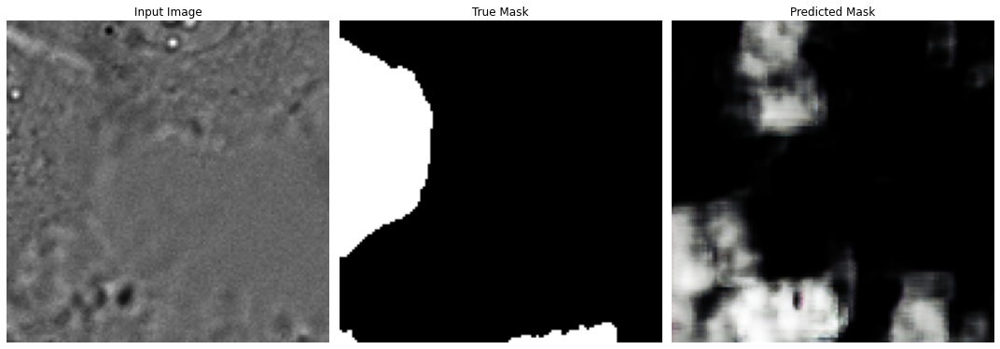

In [ ]:
index = 130
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 2.319422e-19
Average value: 0.010553452


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_128_model_score = calculateMeanIouScore(unet_128_model_3, test_x, test_y, pred_y_thresh)
print(unet_128_model_score)

0.5368141381993564


After running those models several times, the second model has the best IoU Score of 0.22

## Save ST 128 Models

In [ ]:
training_data_code = getcwd() + google_drive_path + "/COMP700_Neural_Network_Code/"

tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_128"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_256"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_512"])

Save:

In [ ]:
path = training_data_code + "COMP700_UNet_Models/ST_128/"

unet_128_model_1.save(path + "st_128_model_1")
unet_128_model_2.save(path + "st_128_model_2")
unet_128_model_3.save(path + "st_128_model_3")

Verify model saved:

In [ ]:
from keras.models import load_model

new_model = load_model(path + "st_128_model_2")

# Check its architecture
new_model.summary()


Model: "UNET_Model_Dimension_128_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 128, 128, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 128, 128, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 128, 128, 16  0           ['c1_a[0][0]']                   
                                )                                        

# Unet ST 256 Model

In [ ]:
temp_path = getImagePaths(training_data_directory + "COMP700_Patchify_Images_256_ST")
collection = []
labels = ["", "", "", ""]

for i in range(len(temp_path)):
    temp = temp_path[i][0]

    collection = temp_path[i]
    collection.sort()

    if ("Training/X" in temp):
      training_x = readImagesViaMatplotlib(collection)
      labels[0] = collection
    elif ("Training/Y" in temp):
      training_y = readImagesViaMatplotlib(collection)
      labels[1] = collection
    elif ("Test/X" in temp):
      test_x = readImagesViaMatplotlib(collection)
      labels[2] = collection
    elif ("Test/Y" in temp):
      test_y = readImagesViaMatplotlib(collection)
      labels[3] = collection
    else:
      print("Unknown path specified")

Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 800
Processed 100 images out of 800
Processed 200 images out of 800
Processed 300 images out of 800
Processed 400 images out of 800
Processed 500 images out of 800
Processed 600 images out of 800
Processed 700 images out of 800
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete


In [ ]:
print(len(training_x), ":::", len(training_y))
print(len(test_x), ":::", len(test_y))

800 ::: 800
200 ::: 200


Verify images match:

In [ ]:
for i in range(5):
    print( extractRhsString(labels[0][i], "/"), ":::", extractRhsString(labels[1][i], "/") )

training_image_0001.png ::: training_mask_0001.png
training_image_0002.png ::: training_mask_0002.png
training_image_0003.png ::: training_mask_0003.png
training_image_0004.png ::: training_mask_0004.png
training_image_0005.png ::: training_mask_0005.png


In [ ]:
count = 0

for i in range(len(training_x)):
    if ( extractRhsString(labels[0][i], "_") != extractRhsString(labels[1][i], "_") ):
        count += 1

print(count, "image(s) do not match")

0 image(s) do not match


Let us load some images to see the training data we have available to us

Index used: 704
Index used: 757
Index used: 680


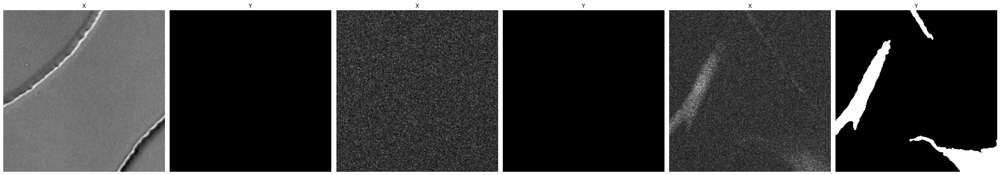

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Index used: 503
Index used: 53
Index used: 509


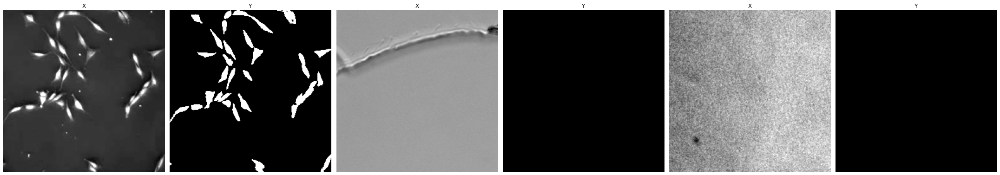

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Now, we can define a Sample Image and Sample Mask in case we with the visualize the training results. The author may disable this callback being used for training as it adds to the RAM usage in Google Colab

544


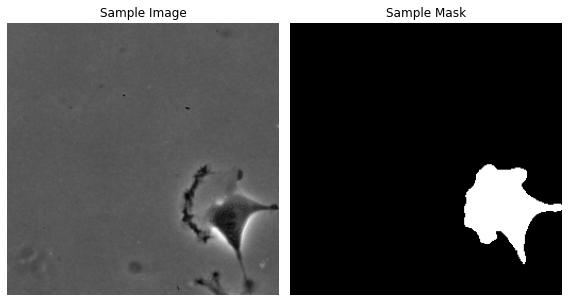

In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

from random import randint

# index = randint(0, len(training_x) - 1)
index = 544 # useful example, or 361
print(index)

sample_image = training_x[index]
sample_mask = training_y[index]

display( [sample_image, sample_mask], ["Sample Image", "Sample Mask"] , figsize=(8,8))

In [ ]:
patch_size = 256
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_256_1"

unet_256_model_1 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_256_model_1.summary()

Model: "UNET_Model_Dimension_256_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 256, 256, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 256, 256, 16  0           ['c1_a[0][0]']                   
                                )                                        

In [ ]:
unet_256_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

1/1 [==============================] - 0s 21ms/step


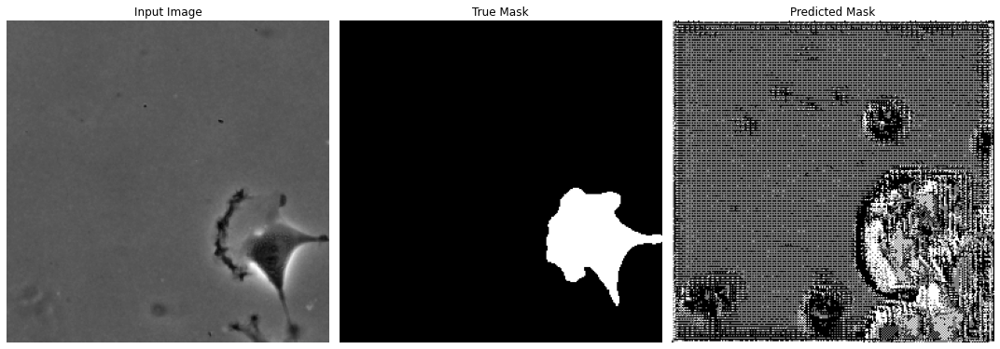


Sample Prediction after epoch 30

200/200 [==============================] - 11s 54ms/step - loss: 0.0442 - accuracy: 0.4005 - val_loss: 0.0272 - val_accuracy: 0.5650


In [ ]:
# Training Below

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_256_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

unet_256_model_1_history = unet_256_model_1.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

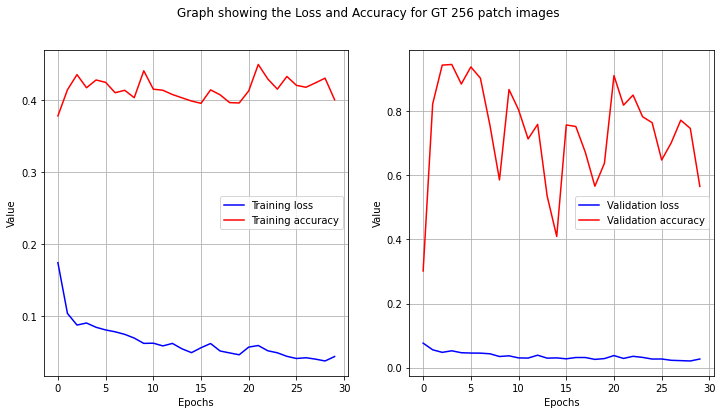

In [ ]:
showTrainingMetrics(unet_256_model_1_history, "Graph showing the Loss and Accuracy for GT 256 patch images")

In [ ]:
pred_y = unet_256_model_1.predict(test_x)

7/7 [==============================] - 3s 193ms/step


0


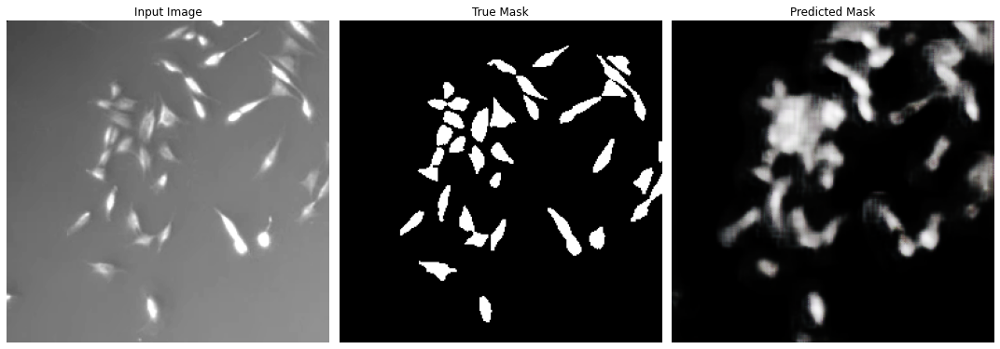

In [ ]:
# index = randint(0, len(test_x)-1)
index = 0 #114
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

114


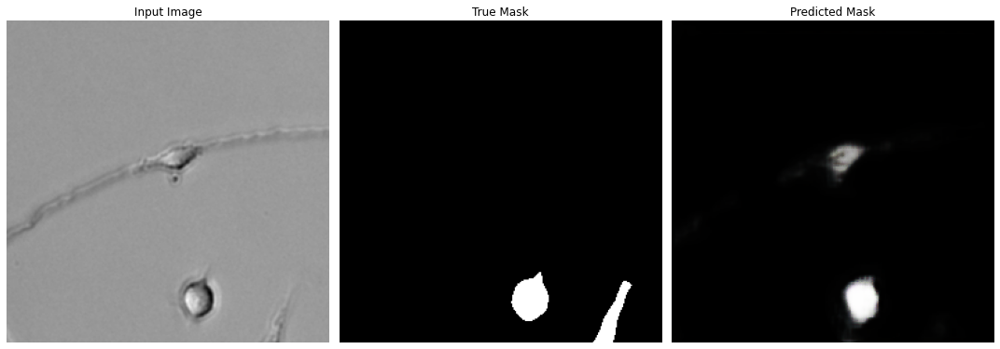

In [ ]:
index = 114
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Let's investigate what the Mean IoU score is:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 1.624992e-10
Average value: 0.02263165


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_256_model_score = calculateMeanIouScore(unet_256_model_1, test_x, test_y, pred_y_thresh)
print(unet_256_model_score)

0.5485953819895445


Let's run that again, and increase the epochs:

1/1 [==============================] - 0s 25ms/step


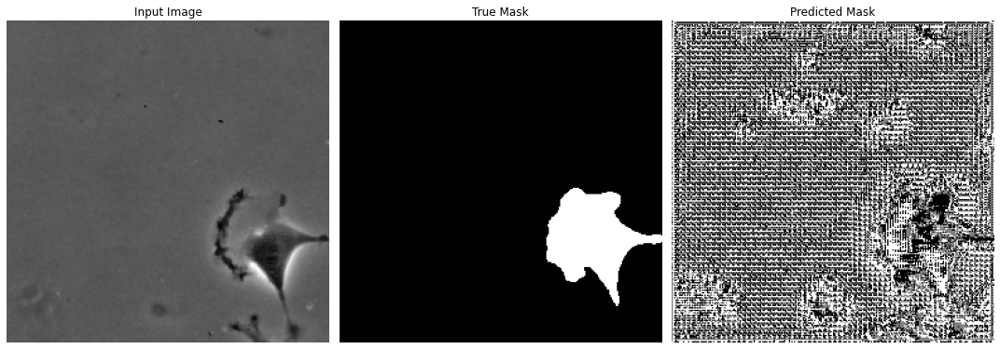


Sample Prediction after epoch 100

200/200 [==============================] - 10s 52ms/step - loss: 0.0168 - accuracy: 0.2840 - val_loss: 0.0143 - val_accuracy: 0.3071


In [ ]:
patch_size = 256
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_256_2"

unet_256_model_2 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_256_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_256_model_2_history = unet_256_model_2.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

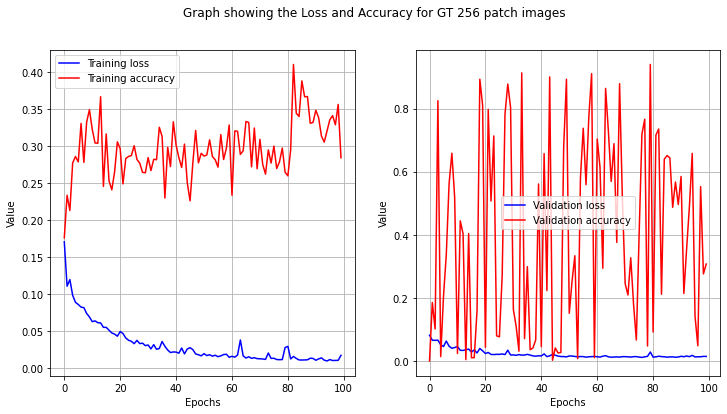

In [ ]:
showTrainingMetrics(unet_256_model_2_history, "Graph showing the Loss and Accuracy for GT 256 patch images")

Predictions:

In [ ]:
pred_y = unet_256_model_2.predict(test_x)

7/7 [==============================] - 1s 97ms/step


0


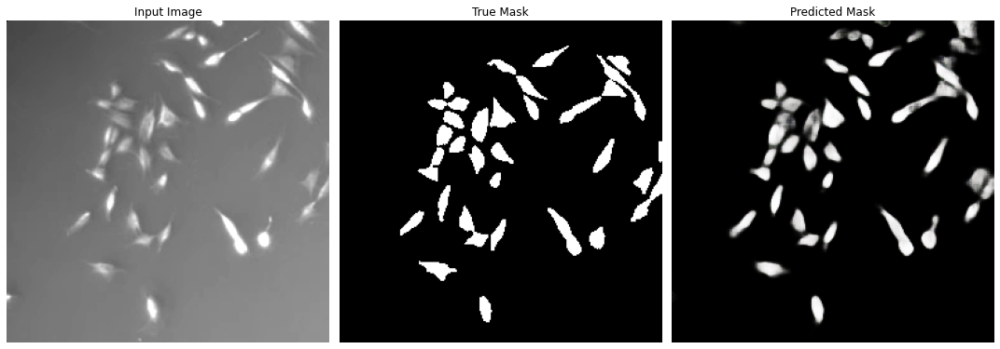

In [ ]:
index = 0
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

114


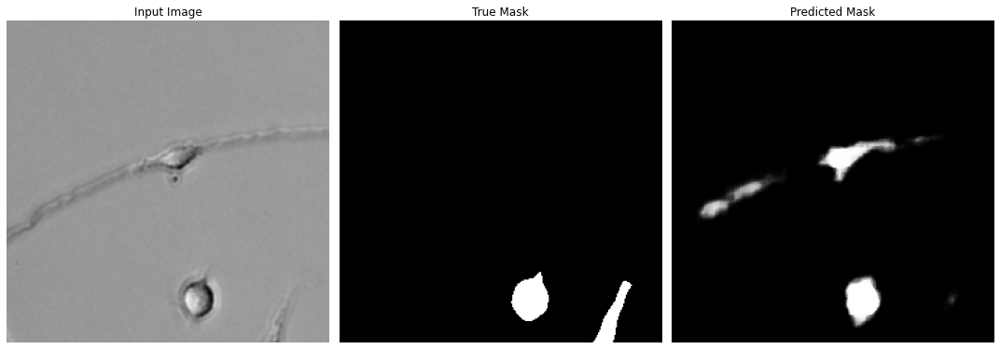

In [ ]:
140index = 114
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 0.0
Average value: 0.01267396


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_256_model_score = calculateMeanIouScore(unet_256_model_2, test_x, test_y, pred_y_thresh)
print(unet_256_model_score)

0.7296357344425555


Let's modify the batch size:

1/1 [==============================] - 0s 18ms/step


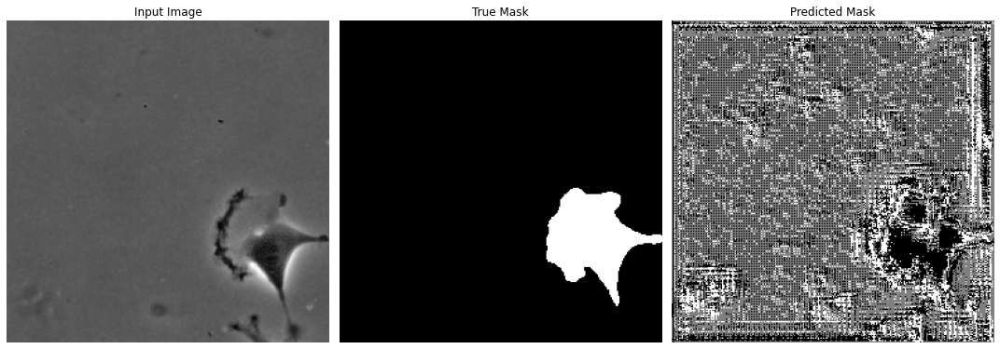


Sample Prediction after epoch 100

100/100 [==============================] - 10s 99ms/step - loss: 0.0094 - accuracy: 0.3084 - val_loss: 0.0113 - val_accuracy: 0.4165


In [ ]:
patch_size = 256
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_256_3"

unet_256_model_3 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_256_model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 8
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_256_model_3_history = unet_256_model_3.fit(
                                            training_x,
                                            training_y, 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x, test_y)
                                            )

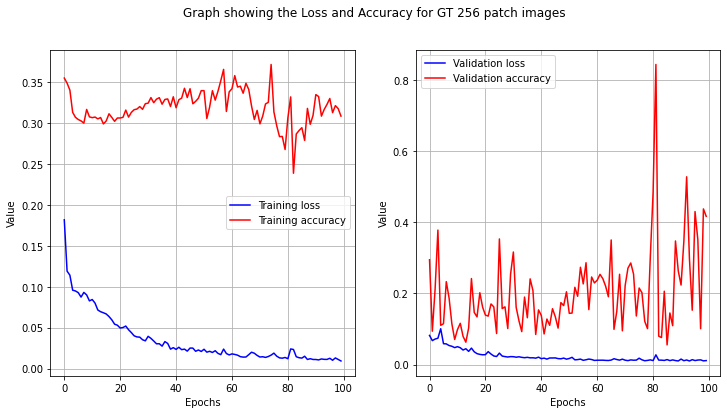

In [ ]:
showTrainingMetrics(unet_256_model_3_history, "Graph showing the Loss and Accuracy for GT 256 patch images")

Predictions:

In [ ]:
pred_y = unet_256_model_3.predict(test_x)

7/7 [==============================] - 1s 85ms/step


0


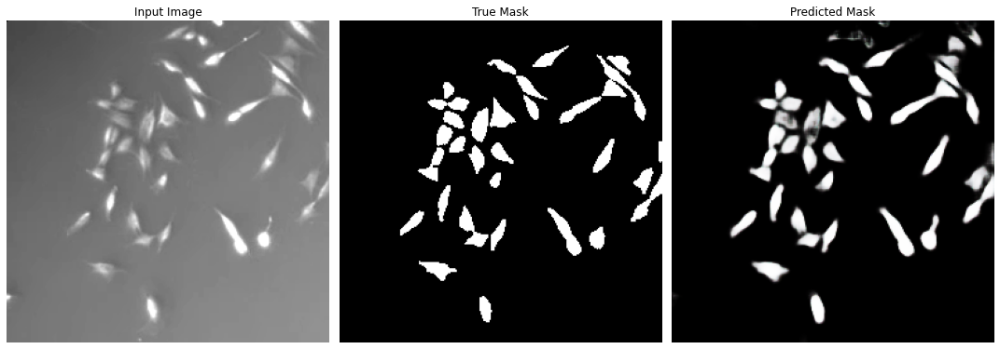

In [ ]:
index = 0
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

114


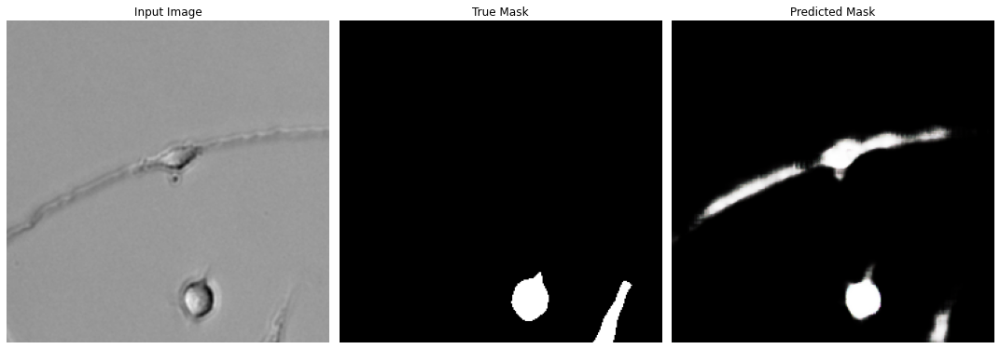

In [ ]:
index = 114
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 1.0
Min Value: 0.0
Average value: 0.013135659


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_256_model_score = calculateMeanIouScore(unet_256_model_3, test_x, test_y, pred_y_thresh)
print(unet_256_model_score)

0.7733200327098522


After running those models several times, the second model has the best IoU Score of 0.22

## Save ST 256 Models

In [ ]:
training_data_code = getcwd() + google_drive_path + "/COMP700_Neural_Network_Code/"

tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_128"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_256"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_512"])

Save:

In [ ]:
path = training_data_code + "COMP700_UNet_Models/ST_256/"

unet_256_model_1.save(path + "st_256_model_1")
unet_256_model_2.save(path + "st_256_model_2")
unet_256_model_3.save(path + "st_256_model_3")

Verify model saved:

In [ ]:
from keras.models import load_model

new_model = load_model(path + "st_256_model_2")

# Check its architecture
new_model.summary()


Model: "UNET_Model_Dimension_256_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 256, 256, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 256, 256, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 256, 256, 16  0           ['c1_a[0][0]']                   
                                )                                        

# Unet ST 512 Model 

In [ ]:
temp_path = getImagePaths(training_data_directory + "COMP700_Patchify_Images_512_ST")
collection = []
labels = ["", "", "", ""]

for i in range(len(temp_path)):
    temp = temp_path[i][0]

    collection = temp_path[i]
    collection.sort()

    if ("Training/X" in temp):
      training_x = readImagesViaMatplotlib(collection)
      labels[0] = collection
    elif ("Training/Y" in temp):
      training_y = readImagesViaMatplotlib(collection)
      labels[1] = collection
    elif ("Test/X" in temp):
      test_x = readImagesViaMatplotlib(collection)
      labels[2] = collection
    elif ("Test/Y" in temp):
      test_y = readImagesViaMatplotlib(collection)
      labels[3] = collection
    else:
      print("Unknown path specified")

Processed 0 images out of 445
Processed 100 images out of 445
Processed 200 images out of 445
Processed 300 images out of 445
Processed 400 images out of 445
Complete
Processed 0 images out of 445
Processed 100 images out of 445
Processed 200 images out of 445
Processed 300 images out of 445
Processed 400 images out of 445
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete
Processed 0 images out of 200
Processed 100 images out of 200
Complete


In [ ]:
print(len(training_x), ":::", len(training_y))
print(len(test_x), ":::", len(test_y))

445 ::: 445
200 ::: 200


Verify images match:

In [ ]:
for i in range(5):
    print( extractRhsString(labels[0][i], "/"), ":::", extractRhsString(labels[1][i], "/") )

training_image_0001.png ::: training_mask_0001.png
training_image_0002.png ::: training_mask_0002.png
training_image_0003.png ::: training_mask_0003.png
training_image_0004.png ::: training_mask_0004.png
training_image_0005.png ::: training_mask_0005.png


In [ ]:
count = 0

for i in range(len(training_x)):
    if ( extractRhsString(labels[0][i], "_") != extractRhsString(labels[1][i], "_") ):
        count += 1

print(count, "image(s) do not match")

0 image(s) do not match


Let us load some images to see the training data we have available to us

Index used: 140
Index used: 81
Index used: 66


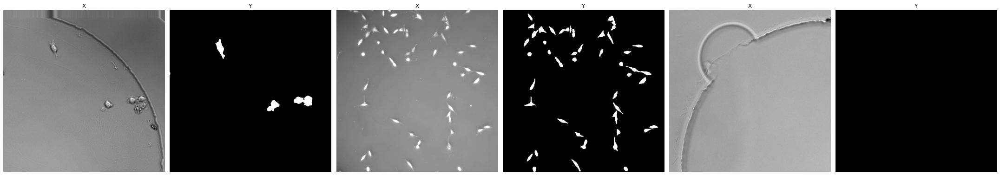

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Index used: 373
Index used: 230
Index used: 284


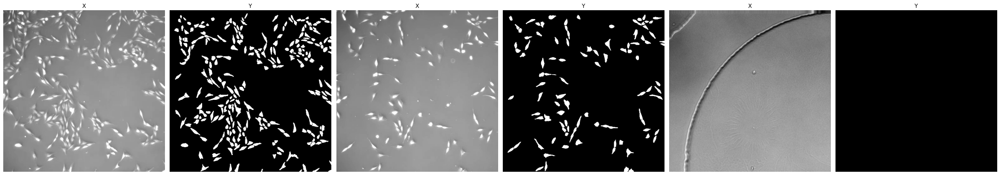

In [ ]:
from random import randint
array, labels = [], []

for i in range(3):
    index = randint(0, len(training_x)-1)
    print("Index used:", index)

    array.append( training_x[index] ) 
    array.append( training_y[index] )
    labels.append( "X" )
    labels.append( "Y" )

display(array, labels, figsize=(30, 30))

Now, we can define a Sample Image and Sample Mask in case we with the visualize the training results. The author may disable this callback being used for training as it adds to the RAM usage in Google Colab

140


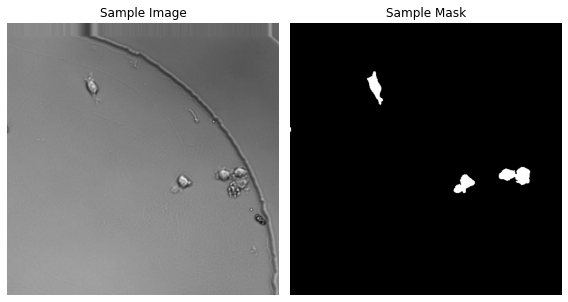

In [ ]:
# global variables used for the model training to visualise results
# this will be updated before we train each model

from random import randint

# index = randint(0, len(training_x) - 1)
index = 140 # useful example, or 490
print(index)

sample_image = training_x[index]
sample_mask = training_y[index]

display( [sample_image, sample_mask], ["Sample Image", "Sample Mask"] , figsize=(8,8))

In [ ]:
patch_size = 512
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_512_1"

unet_512_model_1 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_512_model_1.summary()

Model: "UNET_Model_Dimension_512_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 512, 512, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 512, 512, 16  0           ['c1_a[0][0]']                   
                                )                                        

In [ ]:
unet_512_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

1/1 [==============================] - 0s 20ms/step


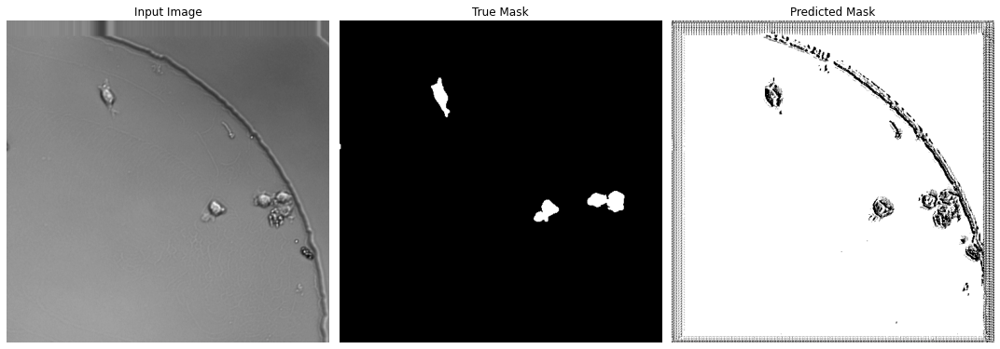


Sample Prediction after epoch 18

111/111 [==============================] - 1s 5ms/step - loss: 0.0323 - accuracy: 0.2265


In [ ]:
# Training Below

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 30
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_512_model_1.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

unet_512_model_1_history = unet_512_model_1.fit(
                                            training_x[:125],
                                            training_y[:125], 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x[:50], test_y[:50])
                                            )

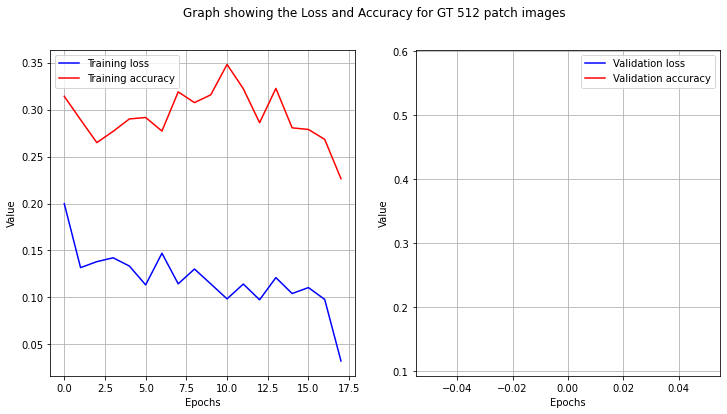

In [ ]:
showTrainingMetrics(unet_512_model_1_history, "Graph showing the Loss and Accuracy for GT 512 patch images")

In [ ]:
pred_y = unet_512_model_1.predict(test_x)

7/7 [==============================] - 9s 580ms/step


159


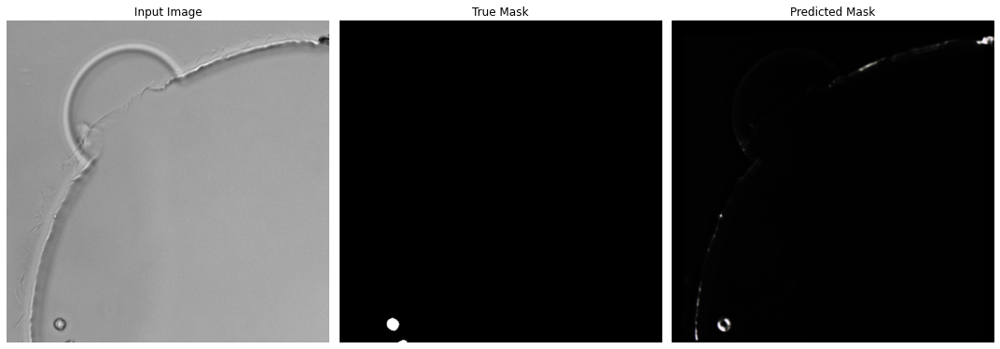

In [ ]:
# index = randint(0, len(test_x)-1)
index = 159 # 190
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

190


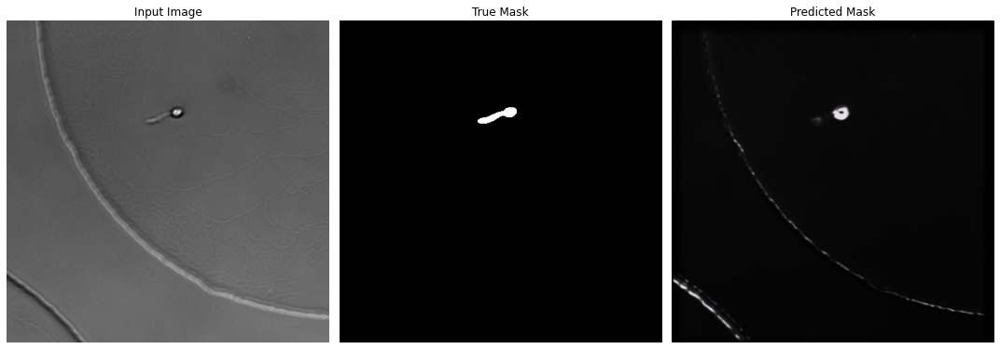

In [ ]:
index = 190
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Let's investigate what the Mean IoU score is:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.6173662
Min Value: 2.471455e-07
Average value: 0.017197417


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_512_model_score = calculateMeanIouScore(unet_512_model_1, test_x, test_y, pred_y_thresh)
print(unet_512_model_score)

1.992501817161657e-06


Let's run that again, and increase the epochs:

1/1 [==============================] - 0s 20ms/step


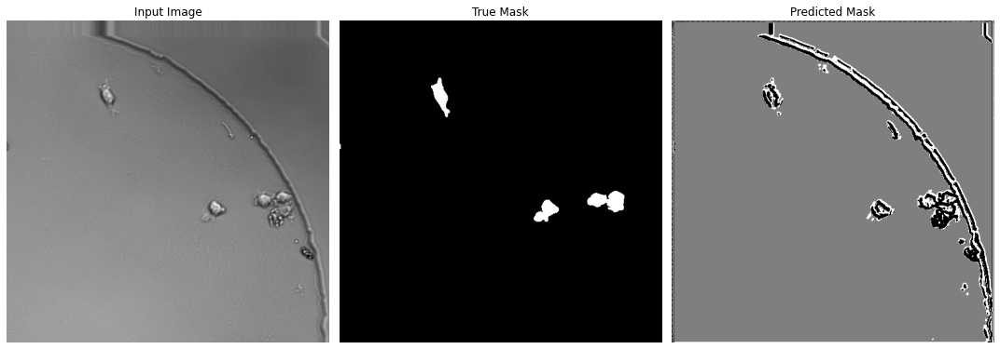


Sample Prediction after epoch 57

111/111 [==============================] - 7s 67ms/step - loss: 0.0771 - accuracy: 0.1072


In [ ]:
patch_size = 512
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_512_2"

unet_512_model_2 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_512_model_2.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 4
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_512_model_2_history = unet_512_model_2.fit(
                                            training_x[:125],
                                            training_y[:125], 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x[:50], test_y[:50])
                                            )

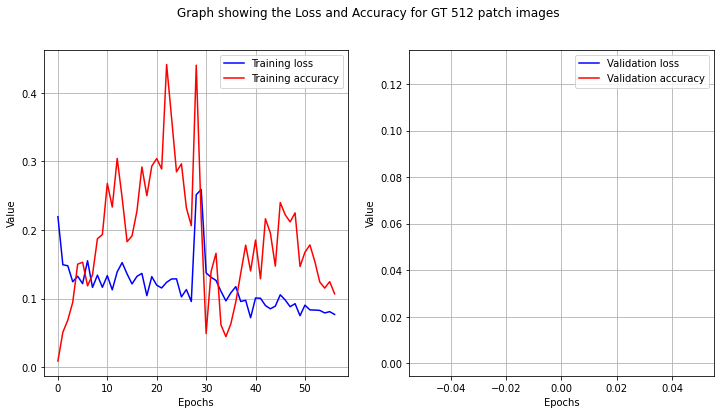

In [ ]:
showTrainingMetrics(unet_512_model_2_history, "Graph showing the Loss and Accuracy for GT 512 patch images")

Predictions:

In [ ]:
pred_y = unet_512_model_2.predict(test_x)

7/7 [==============================] - 2s 366ms/step


159


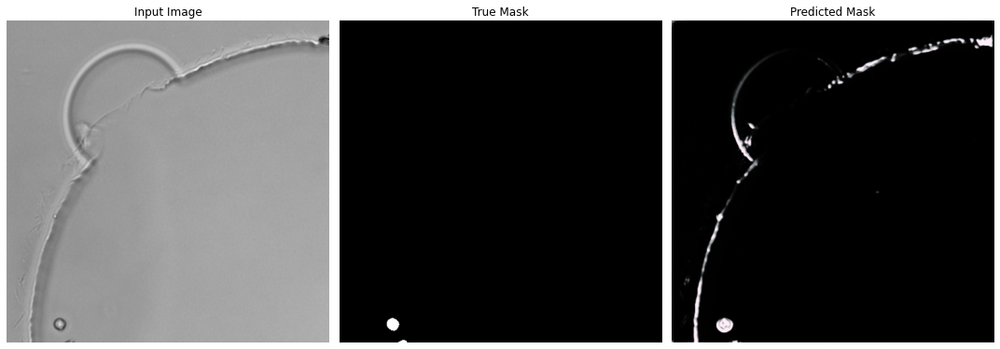

In [ ]:
index = 159
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

190


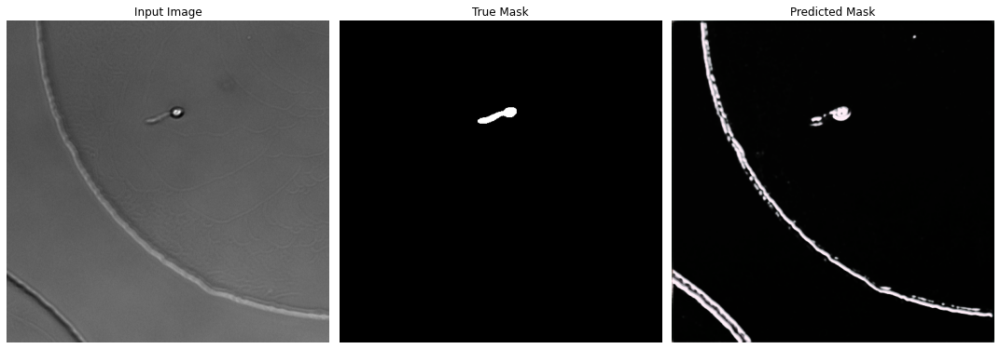

In [ ]:
index = 190
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.41723272
Min Value: 2.782744e-07
Average value: 0.018096896


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_512_model_score = calculateMeanIouScore(unet_512_model_2, test_x, test_y, pred_y_thresh)
print(unet_512_model_score)

0.0


Let's modify the batch size:

1/1 [==============================] - 0s 27ms/step


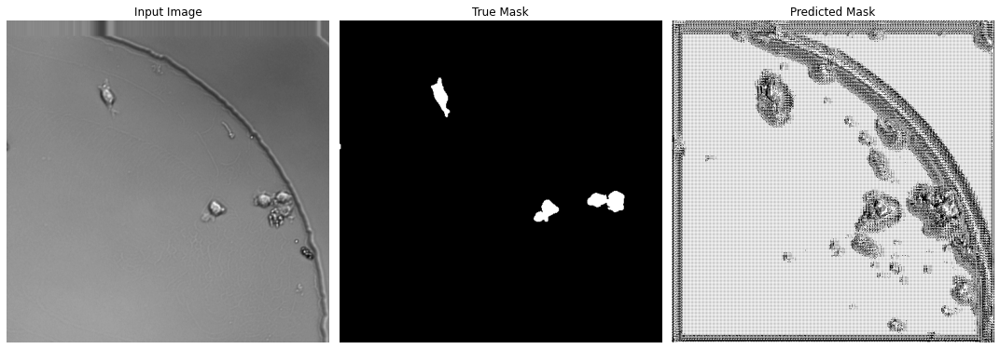


Sample Prediction after epoch 77

55/55 [==============================] - 3s 53ms/step - loss: 0.0137 - accuracy: 0.3132


In [ ]:
patch_size = 512
input_dimensions, output_dimensions = 3, 3
model_name = "UNET_Model_Dimension_512_3"

unet_512_model_3 = simple_unet_model(patch_size, 
                                   patch_size, 
                                   input_dimensions, 
                                   output_dimensions, 
                                   model_name
                                   )

unet_512_model_3.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])

TRAIN_LENGTH = len(training_x)
BATCH_SIZE = 8
VAL_SUBSPLITS = 5

EPOCHS = 100
STEPS_PER_EPOCH = TRAIN_LENGTH // BATCH_SIZE
VALIDATION_STEPS = STEPS_PER_EPOCH // VAL_SUBSPLITS

unet_512_model_3_history = unet_512_model_3.fit(
                                            training_x[:125],
                                            training_y[:125], 
                                            epochs=EPOCHS,
                                            callbacks=[DisplayCb()],
                                            steps_per_epoch=STEPS_PER_EPOCH,
                                            validation_steps=VALIDATION_STEPS,
                                            validation_data=(test_x[:50], test_y[:50])
                                            )

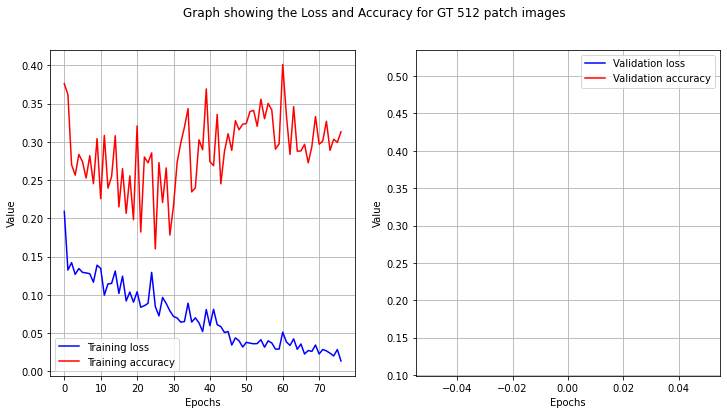

In [ ]:
showTrainingMetrics(unet_512_model_3_history, "Graph showing the Loss and Accuracy for GT 512 patch images")

Predictions:

In [ ]:
pred_y = unet_512_model_3.predict(test_x)

7/7 [==============================] - 9s 580ms/step


159


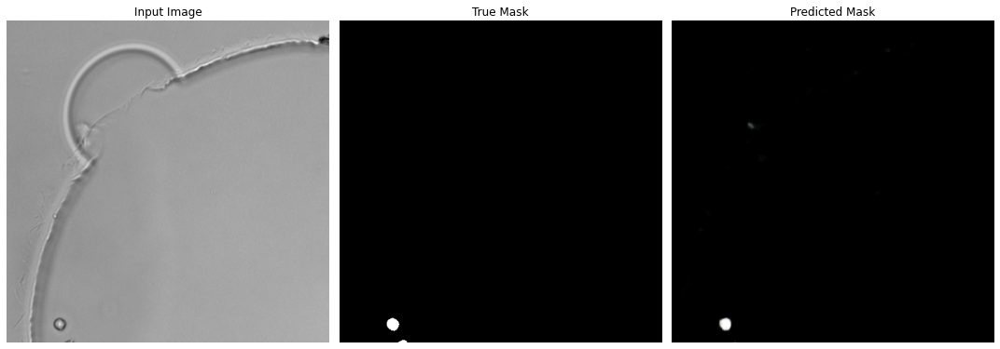

In [ ]:
index = 159
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

190


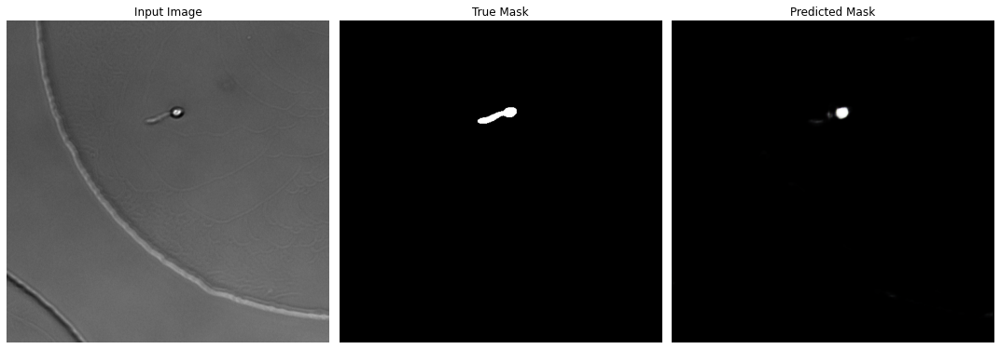

In [ ]:
index = 190
print(index)

display( display_list=[test_x[index], test_y[index], pred_y[index]] )

Score:

In [ ]:
print("Max Value:", np.max(pred_y))
print("Min Value:", np.min(pred_y))
print("Average value:", np.average(pred_y))

Max Value: 0.9999999
Min Value: 2.7758588e-33
Average value: 0.01768555


In [ ]:
# Next, we can compute the Mean IoU score to see how the model did:
threshold = 0.5

pred_y_thresh = pred_y >= threshold

unet_512_model_score = calculateMeanIouScore(unet_512_model_3, test_x, test_y, pred_y_thresh)
print(unet_512_model_score)

0.5005644978066726


After running those models several times, the second model has the best IoU Score of 0.22

## Save ST 512 Models

Save individually because of RAM usage

In [ ]:
training_data_code = getcwd() + google_drive_path + "/COMP700_Neural_Network_Code/"

tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_128"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_256"])
tryMakeDirectories(training_data_code, ["COMP700_UNet_Models", "ST_512"])

Save:

In [ ]:
path = training_data_code + "COMP700_UNet_Models/ST_512/"

In [ ]:
unet_512_model_1.save(path + "st_512_model_1")

In [ ]:
unet_512_model_2.save(path + "st_512_model_2")

In [ ]:
unet_512_model_3.save(path + "st_512_model_3")

In [ ]:
from keras.models import load_model

new_model = load_model(path + "st_512_model_2")

# Check its architecture
new_model.summary()


Model: "UNET_Model_Dimension_512_2"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 Input (InputLayer)             [(None, 512, 512, 3  0           []                               
                                )]                                                                
                                                                                                  
 c1_a (Conv2D)                  (None, 512, 512, 16  448         ['Input[0][0]']                  
                                )                                                                 
                                                                                                  
 c1_b (Dropout)                 (None, 512, 512, 16  0           ['c1_a[0][0]']                   
                                )                                        